In [1]:
import h5py
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import sigmaclip as sigmaclip
from scipy.interpolate import interp1d
from scipy.ndimage import gaussian_filter1d
import astropy.io.fits as fits
import astropy.constants as const
from tqdm.notebook import tnrange
from scipy.optimize import curve_fit
import  batman
import math
import astropy
import barycorrpy

from function import mask_pix
from function import med_n_lim
from function import high_pass_filter
from function import solve_E

import warnings
warnings.filterwarnings('ignore')

In [2]:
# reading SYSREM residuals

# number of order, frame, wavelength, and SysRem iteration (all refer to data after passing SysRem)
numorder, numframe, numwv, n_sys = 22, 56, 4080, 10

#for propagation error
flux_data = np.zeros((numorder,n_sys+1,numframe,numwv))
error_data = flux_data.copy()
wave_data = flux_data.copy()
a_data = np.zeros((numorder,n_sys+1,numframe))
c_data = np.zeros((numorder,n_sys+1,numwv))

for order in range(numorder):
    for sysiter in range(n_sys+1):

    #reading hdf5 file for each SYSREM iteration (default binmedfil=151)
        with h5py.File('data/hdf5/HD149026b-after-#'+str(sysiter)+'-SYSREM-iteration-sys-MJD_to_BJD.hdf5', 'r') as h5f_raw:

            flux_data[order,sysiter] = h5f_raw['flux-order-'+str(order)][()]
            error_data[order,sysiter] = h5f_raw['error-poisson-order-'+str(order)][()]
            wave_data[order,sysiter] = h5f_raw['wv-vac-order-'+str(order)][()]
            airmass = h5f_raw['airmass'][()]
            rvcor = h5f_raw['rv_cor'][()]
            bjd = h5f_raw['bjd'][()]
            jd = h5f_raw['jd'][()]
            phase = h5f_raw['phase'][()]
            rel_phase = h5f_raw['rel_phase'][()]
            hour_phase = h5f_raw['hour_phase'][()]
            exptime = h5f_raw['exp_time'][()]
            out_transit_mask = h5f_raw['out_transit_mask'][()]
            transit_weight = h5f_raw['transit_weight'][()]
            carm_order = h5f_raw['carm_order'][()]
            contact_index = h5f_raw['contact_index'][()]

            if sysiter != 0:
                a_data[order,sysiter-1] = h5f_raw['a-coeff-order-'+str(order)][()]
                c_data[order,sysiter-1] = h5f_raw['c-coeff-order-'+str(order)][()]

# Search for Molecules

In [3]:
def kpvsys_calc(Kp, Vsys, RV, data, vsys_planet, orb_phase, RV_bary, mask, e, w, v_phase, eccentric=False):

    """
    Interpolate CCF values to a range of Kp and Vsys

    Args:
        kp          : K_p sample in km/s
        vsys        : V_sys sample in km/s
        drvs        : RV sample in km/s
        data        : Cross-correlation values to be interpolated (frame x RV)
        vsys_planet : The expected V_sys of the planet
        orb_phase   : Orbital phase of the planet
        brv         : Correction for barycentric velocity
        mask        : A mask for out-transit frames

    Return:
        summed      : Interpolated CCF values
    """

    data = data[mask]
    orb_phase = orb_phase[mask]
    RV_bary = RV_bary[mask]

    kpvsys_frame = np.zeros([Kp.size] + [data.shape[0]] + [Vsys.size])
    for kp_idx,kp in enumerate(Kp):

        # aligning the in-trail CCF to the planetary rest-frame (Vsys ~ 0 km/s)
        if not eccentric: RV_predict = kp * np.sin(2. * np.pi * orb_phase) + RV_bary + vsys_planet
        else: RV_predict = kp * (np.cos((w) + v_phase[mask]) + e*np.cos(w)) / (np.sqrt(1-e**2)) + vsys_planet + RV_bary

        for phase_idx in range(orb_phase.size):
            kpvsys_frame[kp_idx,phase_idx] = interp1d(RV,data[phase_idx],kind='linear')(RV_predict[phase_idx] + Vsys)

    kpvsys_map = kpvsys_frame.sum(axis=1)
    return kpvsys_map

def fitting_histogram(distribution,plot=True):

    # making the histogram
    num_bins = int(1 + 3.322*np.log10(len(distribution))) # following Sturge's rule
    hist_ = plt.hist(distribution,histtype="step",align='mid',bins=num_bins)

    # assigning the value of each bin and the x-axis of the bin itself ~ (right_edge+left_edge)/2
    x_hist_edges,y_hist = hist_[1],hist_[0]
    x_hist = (x_hist_edges[:-1] + x_hist_edges[1:])/2

    # calculating the Gaussian PDF values given Gaussian parameters and random variable X
    def gaus(X, C, X_mean, sigma):
        return C * np.exp(-(X - X_mean)**2 / (2 * sigma**2))
    
    # calculate the mean and standard deviation
    # the standard deviation is the square root of the variance of the distribution, which is defined as the average of the squared differences of the data from the mean.
    mean = sum(x_hist * y_hist) / sum(y_hist)
    sigma = sum(y_hist * (x_hist-mean)**2) / sum(y_hist)

    # Gaussian least-square fitting process
    # the constant C is just a normalization factor, so we can use the maximum value of the distribution
    param_optimised,param_covariance_matrix = curve_fit(gaus,x_hist,y_hist,p0=[max(y_hist),mean,sigma],maxfev=5000)

    # plotting the histogram
    if plot:
        plt.hist(distribution,histtype="step",align='mid',bins=num_bins)
        plt.plot(x_hist,y_hist,label='data')
        plt.plot(x_hist,gaus(x_hist,*param_optimised),label='fit')
        plt.legend()
        plt.show()
        plt.clf()

    # print fit Gaussian parameters
    print("Fit parameters: ")
    print("=====================================================")
    print("C = ", param_optimised[0], "+-", np.sqrt(param_covariance_matrix[0, 0]))
    print("X_mean =", param_optimised[1], "+-", np.sqrt(param_covariance_matrix[1, 1]))
    print("sigma = ", param_optimised[2], "+-", np.sqrt(param_covariance_matrix[2, 2]))
    print("\n")

    return np.abs(param_optimised[2])

# function for cross-correlating model with data, creating Kp-Vsys map, and calculating log-likelihood  mapping
def detect_molecules(wavedat, fluxdat, errordat, adat, wave_modelmol, flux_modelmol,
                     sysrem_iteration, carm_order,
                     RV_sample, Kp_sample, Vsys_sample, A_sample,
                     Kp_planet, Vsys_planet,
                     transit_weight, out_transit_mask, rvcor, phase, e, w, Tp,
                     std_brogi=True, eccentric=False, plot=True,
                     thold_kp=150, thold_vsys=10, dpi=100, neg_Kp=False):

    CC_total_norm_final = []
    CC_shifted_final = []
    CC_combine_final = []
    SN_map_final = []
    SN_map_final_std = []
    Likelihood_F_final = []
    for sys_iter in range(sysrem_iteration):

        if sys_iter != 0:

            # print('################ SYSREM '+str(sys_iter)+' #####################')
            
            K1_all,K2_all,CC_all,N_data = [],[],[],[]
            for idx in range(len(carm_order)):

                flux_obs = fluxdat[idx][sys_iter].copy()
                wave_obs = wavedat[idx][sys_iter].copy()
                error_obs = errordat[idx][sys_iter].copy()
                a_obs = adat[idx][:sys_iter]

                # masking model to the corresponding order wavelength
                masktemp = (wave_modelmol > wave_obs[0][0] - 20) * (wave_modelmol < wave_obs[0][-1] + 20)
                wave_mod,flux_mod = wave_modelmol[masktemp],flux_modelmol[masktemp]

                # Doppler-shift the model (RV_sample x wavelength)
                wave_mod_shifted = wave_obs[0][np.newaxis,:] / (1 + RV_sample*1000/const.c.value)[:,np.newaxis]
                flux_mod_shifted = np.interp(wave_mod_shifted,wave_mod,flux_mod)

                # putting the Doppler-shifted model into common continuum level
                flux_mod_shifted -= np.nanmedian(flux_mod_shifted,axis=1)[:,np.newaxis]
                maskpix = error_obs[0]!=np.inf
                for frame in range(error_obs.shape[0]):
                    flux_obs[frame][maskpix==True] = flux_obs[frame][maskpix] - np.nanmedian(flux_obs[frame][maskpix])

                # calculating the summation terms in the chi^2 equation
                K1 = np.nansum(flux_obs**2/error_obs**2,axis=1)
                K2 = np.dot(1./error_obs**2,(flux_mod_shifted**2).T)
                CC = np.dot(flux_obs/error_obs**2,flux_mod_shifted.T)

                K1_all.append(K1)
                K2_all.append(K2)
                CC_all.append(CC)

                # computing total data points N including masked pixels
                N_data.append(len(wave_obs[0]))

            # summing over orders
            K1_total = np.sum(K1_all,axis=0)
            K2_total = np.sum(K2_all,axis=0)
            CC_total = np.sum(CC_all,axis=0)
            Ndata_total = np.sum(N_data)

            # normalizing
            CC_total_norm = CC_total - np.nanmedian(CC_total,axis=1)[:,np.newaxis]

            # expected RV path
            v_phase = phase.copy()
            if not eccentric: RV_planet = Kp_planet * np.sin(2. * np.pi * phase) + (-rvcor) + Vsys_planet
            else: 
                # transit_weight, out_transit_mask, v_phase = calc_v(e,w,Tp)
                RV_planet = Kp_planet * (np.cos((w) + v_phase) + e*np.cos(w)) + Vsys_planet + -(rvcor)

            # shifting to planetary rest frame
            CC_shifted = np.zeros([phase.size] + [Vsys_sample.size])
            for frame in range (phase.size):
                CC_shifted[frame] = interp1d(RV_sample,CC_total_norm[frame])(RV_planet[frame] + Vsys_sample)
            
            # combine weighted values over time
            CC_combine = np.sum(CC_shifted * transit_weight[:,np.newaxis], axis=0)

            CC_total_norm_final.append(CC_total_norm)
            CC_shifted_final.append(CC_shifted)
            CC_combine_final.append(CC_combine)

            # note: transit_weight acts like scale factor on the chi^2 computation (K1 not weighted, K2 weighted by squared)*transit_weight[:,np.newaxis]
            # note: barycentric RV should be given in negative due to the signing adoption of CARMENES pipeline (see e.g., Webb+ 2022)
            CC_all_kpvsys = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,CC_total*transit_weight[:,np.newaxis]\
                            ,Vsys_planet,np.array(phase),-np.array(rvcor),out_transit_mask>0,e,w,v_phase,eccentric=eccentric)
            K2_all_kpvsys = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,K2_total*np.square(transit_weight[:,np.newaxis])\
                            ,Vsys_planet,np.array(phase),-np.array(rvcor),out_transit_mask>0,e,w,v_phase,eccentric=eccentric)
            K1_all_kpvsys = K1_total[out_transit_mask>0].sum()
            Ndata_total *= len(out_transit_mask[out_transit_mask>0]) # multiply by the number of in-transit frames

            # index of the location of the expected planet location
            vsys_expect = (np.abs(Vsys_sample - 0)).argmin() # since the Kp-Vsys map is in the planet rest-frame (see the kpvsys_calc function)
            kp_expect = (np.abs(Kp_sample - Kp_planet)).argmin()

            ################################## Kp-Vsys Map ##################################

            # CC for Kp-Vsys map (must be normalised)
            CC_all_kpvsys_norm = kpvsys_calc(Kp_sample,Vsys_sample,RV_sample,CC_total_norm*transit_weight[:,np.newaxis]\
                            ,Vsys_planet,np.array(phase),-np.array(rvcor),out_transit_mask>0,e,w,v_phase,eccentric=eccentric)
            
            # index of maximum value in the Kp-Vsys map
            kp_snmax,vsys_snmax = np.unravel_index(CC_all_kpvsys_norm.argmax(),CC_all_kpvsys_norm.shape)

            # masking the maximum signal in the map (+-thold)
            masked_peak = CC_all_kpvsys_norm != np.inf
            kp_maskpeak = np.digitize([Kp_sample[kp_snmax] - thold_kp, Kp_sample[kp_snmax] + thold_kp], Kp_sample)
            vsys_maskpeak = np.digitize([Vsys_sample[vsys_snmax] - thold_vsys, Vsys_sample[vsys_snmax] + thold_vsys], Vsys_sample)
            masked_peak[kp_maskpeak[0]:kp_maskpeak[-1],vsys_maskpeak[0]:vsys_maskpeak[-1]] = False

            # masking telluric region Kp ~ 0-50 km/s for all Vrest
            if not neg_Kp:
                kp_tel = (np.abs(Kp_sample - 50)).argmin()
                masked_peak[:kp_tel,:] = False
            else:
                kp_tel = (np.abs(Kp_sample + 50)).argmin()
                masked_peak[kp_tel:,:] = False
            
            # choosing between using std calculation from Brogi or the conventional
            if not std_brogi:
                # map_std = kpvsys_sigma_conventional(CC_all_kpvsys_norm,Kp_sample,Vsys_sample,kp_snmax,vsys_snmax,kp_negative)
                map_std = np.std(CC_all_kpvsys_norm[masked_peak])
            else:
                map_std = fitting_histogram(CC_all_kpvsys_norm[masked_peak],plot=plot)

            SN_map = CC_all_kpvsys_norm / map_std
            SN_map_final.append(SN_map)
            # SN_map_final.append(CC_all_kpvsys_norm)
            SN_map_final_std.append(map_std)

            # ################################## Likelihood Computation ##################################

            # compute chi^2
            chi2_total = K1_all_kpvsys + A_sample[:,np.newaxis,np.newaxis]**2. * K2_all_kpvsys[np.newaxis,...] -\
                        2. * A_sample[:,np.newaxis,np.newaxis] * CC_all_kpvsys[np.newaxis,...]

            # compute likelihood
            logL = -Ndata_total / 2 * np.log(chi2_total / Ndata_total)
            Likelihood_F = np.exp(logL-np.max(logL))

            Likelihood_F_final.append(Likelihood_F)

            # marginilising Kp, Vsys, and alpha
            Kp_marg = Likelihood_F.sum(axis=(0,2)) #for Kp
            Vsys_marg = Likelihood_F.sum(axis=(0,1)) #for Vsys
            A_marg = Likelihood_F.sum(axis=(1,2)) #for alpha
            
            # compute the median and 1-sigma value of the posterior and corresponding parameter value
            std_A_low,med_A,std_A_high = med_n_lim(A_sample,A_marg)
            std_vsys_low,med_vsys,std_vsys_high = med_n_lim(Vsys_sample,Vsys_marg)
            std_kp_low,med_kp,std_kp_high = med_n_lim(Kp_sample,Kp_marg)

            # conditional likelihood at maximum signal
            A_cond = Likelihood_F[:,np.argmax(Kp_marg),np.argmax(Vsys_marg)]
            std_Ac_low,med_Ac,std_Ac_high = med_n_lim(A_sample,A_cond)

            if plot:

                colorm = 'viridis'
                cmap = plt.get_cmap(colorm)
                cmap.set_bad(color = 'white', alpha = 1.)
                
                ################################### CC map ################################### 

                axes_rvmap = [0, 0, 0.4, 0.6]
                axes_vsysmap = [0 + 0.4, 0, 0.3, 0.6]
                axes_cccombcurve = [0 + 0.4 + 0.3 + 0.02, 0, 0.2, 0.6]

                fig = plt.figure(figsize=(10, 4),dpi=dpi)
                rvmap = plt.axes(axes_rvmap)
                vsysmap = plt.axes(axes_vsysmap)
                cccombcurve = plt.axes(axes_cccombcurve)

                frames = rel_phase # np.arange(len(rel_phase))

                rvmap.pcolormesh(RV_sample, frames, CC_total_norm, cmap=cmap)
                rvmap.set_ylabel("Frame number")
                rvmap.set_xlabel("RV (km/s)")
                rvmap.plot((RV_planet[0], RV_planet[contact_index[0]]), (frames[0], frames[contact_index[0]]), ls='--', color='red', alpha=1, lw=1)
                rvmap.plot((RV_planet[-1], RV_planet[contact_index[3]]), (frames[-1], frames[contact_index[3]]), ls='--', color='red', alpha=1, lw=1)
                rvmap.axhline(y=frames[contact_index[0]], c="white", lw=1, alpha=1, ls="--")
                rvmap.axhline(y=frames[contact_index[1]], c="white", lw=1, alpha=1, ls="--")
                rvmap.axhline(y=frames[contact_index[2]], c="white", lw=1, alpha=1, ls="--")
                rvmap.axhline(y=frames[contact_index[3]], c="white", lw=1, alpha=1, ls="--")
                #rvmap.plot(rvp_min,frames,lw=1,ls='--',alpha=0.8,c='white')
                #rvmap.plot(rvp_max,frames,lw=1,ls='--',alpha=0.8,c='white')

                vsysmap.pcolormesh(Vsys_sample, frames, CC_shifted, cmap=cmap)
                vsysmap.set_xlabel("V$_{sys,rest}$ (km/s)")
                vsysmap.set_yticklabels([])
                vsysmap.plot((0, 0), (frames[0], frames[contact_index[0]]), ls='--', color='red', alpha=1, lw=1)
                vsysmap.plot((0, 0), (frames[-1], frames[contact_index[3]]), ls='--', color='red', alpha=1, lw=1)
                vsysmap.axhline(y=frames[contact_index[0]], c="white", lw=1, alpha=1, ls="--")
                vsysmap.axhline(y=frames[contact_index[1]], c="white", lw=1, alpha=1, ls="--")
                vsysmap.axhline(y=frames[contact_index[2]], c="white", lw=1, alpha=1, ls="--")
                vsysmap.axhline(y=frames[contact_index[3]], c="white", lw=1, alpha=1, ls="--")
                # vsysmap.axhline(y=frames[44], c="red", lw=1, alpha=1, ls="--")
                #vsysmap.axvline(x=-10*sampling,lw=1,ls='--',alpha=0.8,c='white')
                #vsysmap.axvline(x=+10*sampling,lw=1,ls='--',alpha=0.8,c='white')

                cccombcurve.plot(Vsys_sample, CC_combine)
                cccombcurve.axvline(x=0, ls="--", alpha=0.5)
                cccombcurve.set_xlabel("V$_{sys,rest}$ (km/s)")
                cccombcurve.yaxis.set_ticks_position('right')
                cccombcurve.yaxis.set_label_position("right")
                cccombcurve.set_ylabel('Combined in-transit normalised CCF values', rotation=270, labelpad=14)
                cccombcurve.set_title("#" + str(sys_iter) + " SYSREM")

                plt.show(block=False)
                plt.clf()

                ################################### Kp-Vsys map ################################### 

                def kpvsys_plot(kpvsys,label,vmax=vsys_snmax,kmax=kp_snmax,shade=False):

                    axes_kpvsysmap = [0, 0, 0.5, 0.5]
                    axes_vsyscurve = [0, 0 + 0.5, 0.5, 0.2]
                    axes_kpcurve = [0 + 0.5, 0, 0.2, 0.5]

                    fig = plt.figure(figsize=(7, 6))
                    kpvsysmap = plt.axes(axes_kpvsysmap)
                    kpcurve = plt.axes(axes_kpcurve)
                    vsyscurve = plt.axes(axes_vsyscurve)

                    SN_mapcolorbar = kpvsysmap.pcolormesh(Vsys_sample, Kp_sample, kpvsys, cmap=cmap)
                    kpvsysmap.set_xlabel("V$_{sys}$ (km/s)")
                    kpvsysmap.set_ylabel("K$_{p}$ (km/s)")
                    gap = 30
                    # vertical lines
                    kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[0], Kp_sample[kmax] - gap), ls='--',
                                color='white', alpha=1, lw=1)
                    kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[-1], Kp_sample[kmax] + gap), ls='--',
                                color='white', alpha=1, lw=1)
                    # horizontal lines
                    kpvsysmap.plot((Vsys_sample[0], Vsys_sample[vmax] - gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                                color='white', alpha=1, lw=1)
                    kpvsysmap.plot((Vsys_sample[-1], Vsys_sample[vmax] + gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                                color='white', alpha=1, lw=1)
                    kpvsysmap.plot(Vsys_sample[vmax],Kp_sample[kmax],'x',c='magenta')
                    kpvsysmap.plot(Vsys_sample[vsys_expect],Kp_sample[kp_expect],'+',c='cyan')
                    kpvsysmap.set_ylim([min(Kp_sample), max(Kp_sample)])
                    kpvsysmap.set_xlim([min(Vsys_sample), max(Vsys_sample)])
                    plt.colorbar(SN_mapcolorbar, label=label, ax=kpcurve)

                    if shade:
                        kpvsysmap.fill_between(Vsys_sample[vsys_maskpeak[0]:vsys_maskpeak[-1]],Kp_sample[kp_maskpeak[0]],Kp_sample[kp_maskpeak[-1]-1],alpha=0.05,color='white')

                    # Kp and Vsys curves are taken from the maximum S/N in the map
                    kpcurve.plot(kpvsys[:, vmax], Kp_sample)
                    kpcurve.set_xlabel(label)
                    kpcurve.set_yticklabels([])
                    kpcurve.axhline(y=Kp_sample[kmax], ls='--')
                    kpcurve.set_ylim([min(Kp_sample), max(Kp_sample)])

                    vsyscurve.plot(Vsys_sample, kpvsys[kmax, :])
                    vsyscurve.set_ylabel(label)
                    vsyscurve.set_xticklabels([])
                    vsyscurve.axvline(x=Vsys_sample[vmax], ls='--')
                    vsyscurve.set_xlim([min(Vsys_sample), max(Vsys_sample)])

                    plt.show(block=False)
                    plt.clf()

                kpvsys_plot(SN_map,"S/N")
                
                kp_lmax,vsys_lmax = np.unravel_index(Likelihood_F.sum(axis=0).argmax(),Likelihood_F.sum(axis=0).shape)
                kpvsys_plot(Likelihood_F.sum(axis=0),r'$\log(\mathcal{L})-\log(\mathcal{L}_{max})$',vmax=vsys_lmax,kmax=kp_lmax,shade=False)

                ################################### Likelihood corner plot ################################### 

                axes_alpvsys = [0, 0, 0.3, 0.3]
                axes_alpkp = [0 + 0.3 + 0.02, 0, 0.3, 0.3]
                axes_kpvsys = [0, 0 + 0.3 + 0.02, 0.3, 0.3]
                axes_vsysmarg = [0, 0 + 0.3 + 0.3 + 0.04, 0.3, 0.3]
                axes_kpmarg = [0 + 0.3 + 0.02, 0 + 0.3 + 0.02, 0.3, 0.3]
                axes_alpmarg = [0 + 0.3 + 0.3 + 0.02 + 0.02, 0, 0.3, 0.3]

                fig = plt.figure(figsize=(7, 7))
                vsysalp = plt.axes(axes_alpvsys)
                kpalp = plt.axes(axes_alpkp)
                kpvsys = plt.axes(axes_kpvsys)
                vsysmarg = plt.axes(axes_vsysmarg)
                kpmarg = plt.axes(axes_kpmarg)
                alpmarg = plt.axes(axes_alpmarg)

                vsysalp.set_ylabel(r"$\alpha$")
                vsysalp.set_xlabel(r"$V_{sys}$ (km/s)")
                kpalp.set_xlabel(r"$K_p$ (km/s)")
                kpvsys.set_ylabel(r"$K_p$ (km/s)")
                alpmarg.set_xlabel(r"$\alpha$")

                kpalp.set_yticklabels([])
                kpvsys.set_xticklabels([])
                alpmarg.set_yticklabels([])
                kpmarg.set_yticklabels([])
                kpmarg.set_xticklabels([])
                vsysmarg.set_xticklabels([])

                vsysmarg.step(Vsys_sample, Vsys_marg, c="black", lw=1)
                vsysmarg.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
                vsysmarg.set_ylim(bottom=0)
                vsysmarg.axvline(x=med_vsys, lw=1, ls='--', c='black')
                vsysmarg.axvline(x=med_vsys - abs(std_vsys_low), lw=1, ls='--', c='red')
                vsysmarg.axvline(x=med_vsys + abs(std_vsys_high),lw=1, ls='--', c='red')
                vsysmarg.set_title(r'$V_{sys} = $' + str(round(med_vsys, 2)) + r'$^{+' + str("%.2f" % std_vsys_high) + '}_{-' + str(
                    "%.2f" % abs(std_vsys_low)) + '}$ km/s')

                norm_like_vsys = Likelihood_F.sum(axis=1)
                X, Y = np.meshgrid(Vsys_sample, A_sample)
                vsysalp.contourf(X, Y, norm_like_vsys, cmap="Greys")
                # plt.clabel(contours, inline=True, fontsize=8)
                # vsysalp.pcolormesh(Vsys_sample, A_sample, norm_like_vsys / np.max(norm_like_vsys), cmap="binary")
                vsysalp.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
                vsysalp.set_ylim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])

                kpmarg.step(Kp_sample, Kp_marg, c="black", lw=1)
                kpmarg.set_xlim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])
                kpmarg.set_ylim(bottom=0)
                kpmarg.axvline(x=med_kp, lw=1, ls='--', c='black')
                kpmarg.axvline(x=med_kp - abs(std_kp_low), lw=1, ls='--', c='red')
                kpmarg.axvline(x=med_kp + abs(std_kp_high),lw=1, ls='--', c='red')
                kpmarg.set_title(r'$K_{p} = $' + str(round(med_kp, 2)) + r'$^{+' + str("%.2f" % std_kp_high) + '}_{-' + str(
                    "%.2f" % abs(std_kp_low)) + '}$ km/s')

                norm_like_kp = Likelihood_F.sum(axis=2)
                X, Y = np.meshgrid(Kp_sample, A_sample)
                kpalp.contourf(X, Y, norm_like_kp, cmap="Greys")
                # plt.clabel(contours, inline=True, fontsize=8)
                # kpalp.pcolormesh(Kp_sample, A_sample, norm_like_kp / np.max(norm_like_kp), cmap="binary")
                kpalp.set_xlim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])
                kpalp.set_ylim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])

                norm_like_kpvsys = Likelihood_F.sum(axis=0)
                X, Y = np.meshgrid(Vsys_sample, Kp_sample)
                kpvsys.contourf(X, Y, norm_like_kpvsys, cmap="Greys")
                # plt.clabel(contours, inline=True, fontsize=8)
                # kpvsys.pcolormesh(Vsys_sample, Kp_sample, norm_like_kpvsys / np.max(norm_like_kpvsys), cmap="binary")
                kpvsys.set_xlim([med_vsys - 5 * abs(std_vsys_low), med_vsys + 5 * abs(std_vsys_high)])
                kpvsys.set_ylim([med_kp - 5 * abs(std_kp_low), med_kp + 5 * abs(std_kp_high)])

                alpmarg.step(A_sample, A_marg, c='black', lw=1)
                alpmarg.axvline(x=med_A, lw=1, ls='--', c='black')
                alpmarg.axvline(x=med_A - abs(std_A_low),lw=1, ls='--', c='red')
                alpmarg.axvline(x=med_A + abs(std_A_high),lw=1, ls='--', c='red')
                alpmarg.set_xlim([med_A - 5 * abs(std_A_low), med_A + 5 * abs(std_A_high)])
                alpmarg.set_ylim(bottom=0)
                alpmarg.set_title(r'$\alpha = $' + str(round(med_A, 2)) + r'$^{+' + str("%.2f" % std_A_high) + '}_{-' + str(
                    "%.2f" % abs(std_A_low)) + '}$')

                vsysalp.axvline(x=med_vsys, lw=1, ls='--', c='black')
                vsysalp.axhline(y=med_A, lw=1, ls='--', c='black')
                kpalp.axvline(x=med_kp, lw=1, ls='--', c='black')
                kpalp.axhline(y=med_A, lw=1, ls='--', c='black')
                kpvsys.axvline(x=med_vsys, lw=1, ls='--', c='black')
                kpvsys.axhline(y=med_kp, lw=1, ls='--', c='black')

                kpmarg.tick_params(left=False)
                vsysmarg.tick_params(left=False, labelleft=False)
                alpmarg.tick_params(left=False)

                plt.show(block=False)
                plt.clf()

            print('SYSREM '+str(str(sys_iter)))
            print('')
            print('Max. peak from S/N map:')
            print('Kp = '+str(Kp_sample[kp_snmax])+' km/s')
            print('Vsys = '+str(Vsys_sample[vsys_snmax])+' km/s')
            print('S/N = '+str(round(SN_map[kp_snmax,vsys_snmax],2)))
            print('')
            print('Max. peak from likelihood distribution:')
            print('Kp = '+str(Kp_sample[np.argmax(Kp_marg)])+' km/s')
            print('Vsys = '+str(Vsys_sample[np.argmax(Vsys_marg)])+' km/s')
            print('Significance = '+str(round(med_Ac/std_Ac_high,2))+' (\u03B1 = '+str("%.2f"%med_Ac)+' \u00B1 {'\
                +str("%.2f"%std_Ac_high)+','+str("%.2f"%np.abs(std_Ac_low))+'})')
            print('')

    return SN_map_final, SN_map_final_std, CC_total_norm_final,CC_shifted_final,CC_combine_final

## H2O

### SysRem iteration assessment


In [4]:
# reading model
flux_modelmol = pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl')
wave_modelmol = pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl')

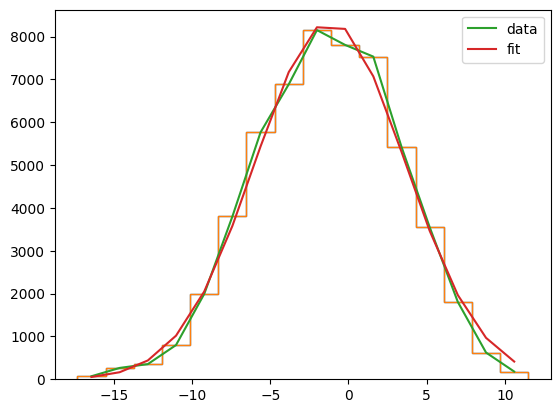

Fit parameters: 
C =  8342.900137786643 +- 146.88167889496813
X_mean = -1.1736810053469986 +- 0.09758954204492755
sigma =  -4.803333150221254 +- 0.09801057441100286




<Figure size 640x480 with 0 Axes>

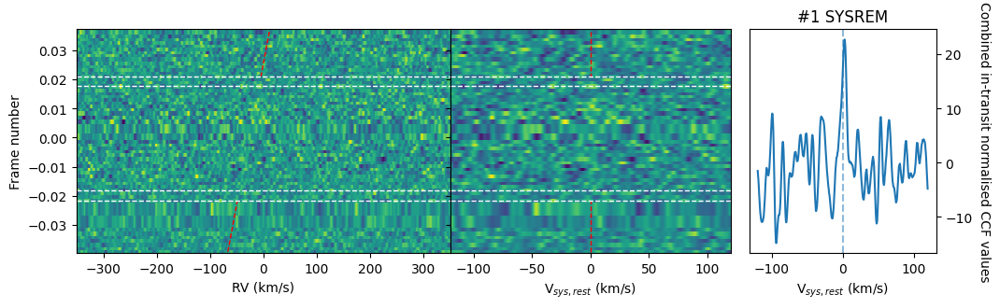

<Figure size 640x480 with 0 Axes>

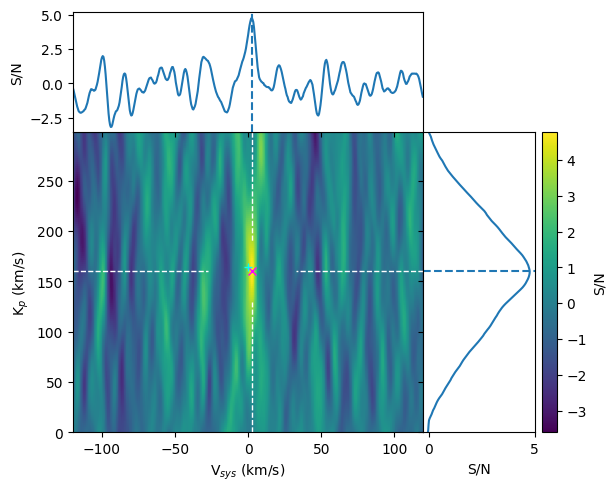

<Figure size 640x480 with 0 Axes>

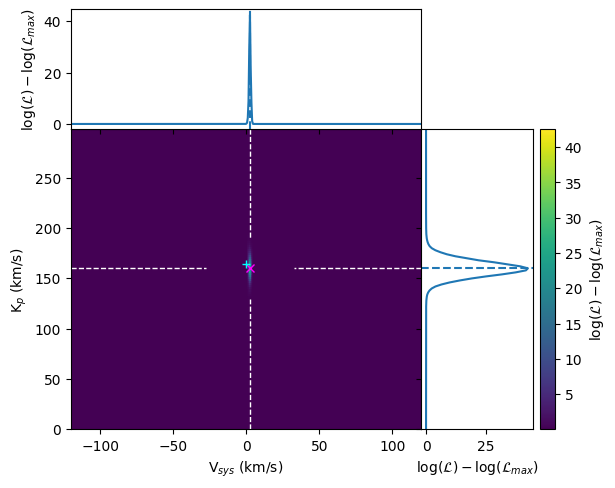

<Figure size 640x480 with 0 Axes>

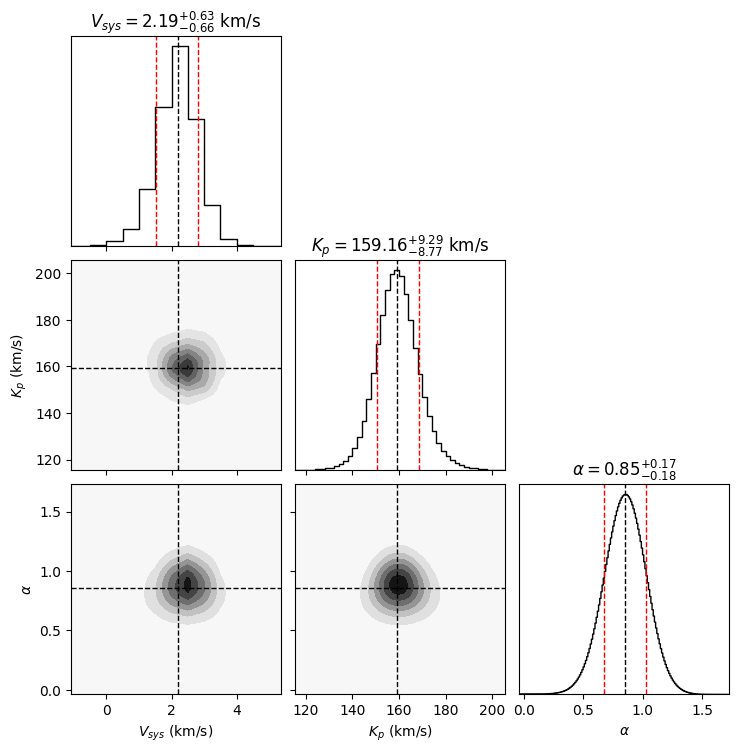

SYSREM 1

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.5 km/s
S/N = 4.77

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.5 km/s
Significance = 5.29 (α = 0.90 ± {0.17,0.17})



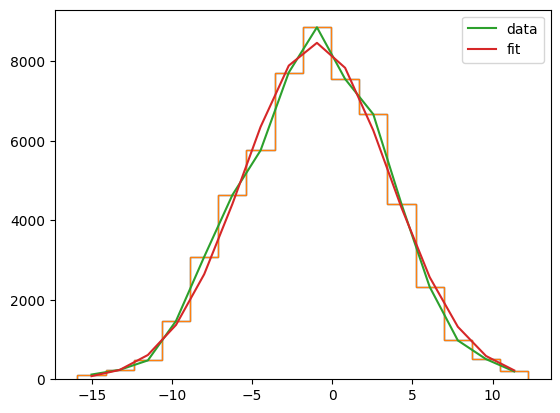

Fit parameters: 
C =  8466.559496413664 +- 176.44427468362846
X_mean = -0.9950504561809496 +- 0.11019257784301632
sigma =  4.580383100147932 +- 0.11036413422359807




<Figure size 640x480 with 0 Axes>

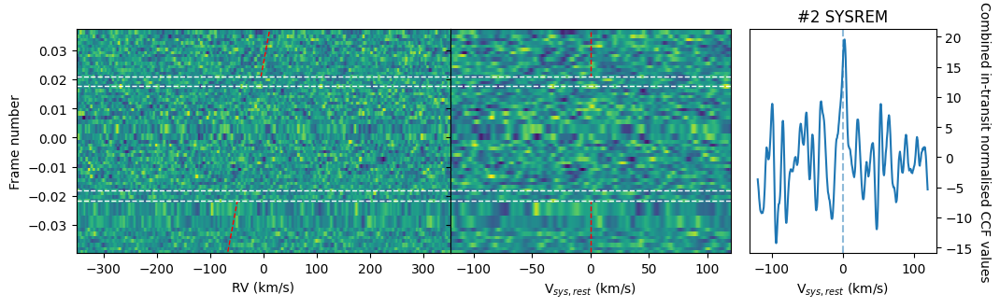

<Figure size 640x480 with 0 Axes>

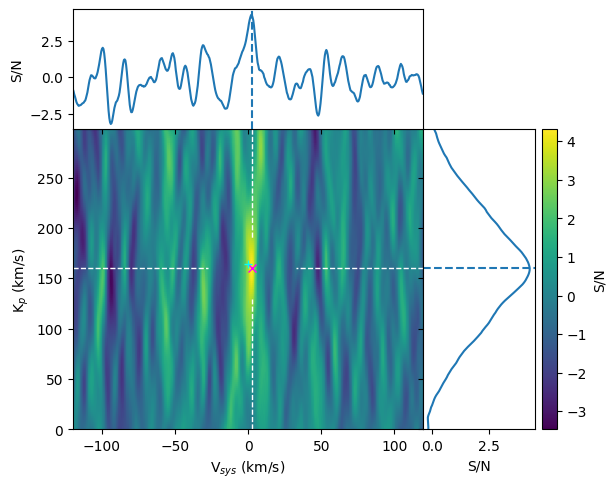

<Figure size 640x480 with 0 Axes>

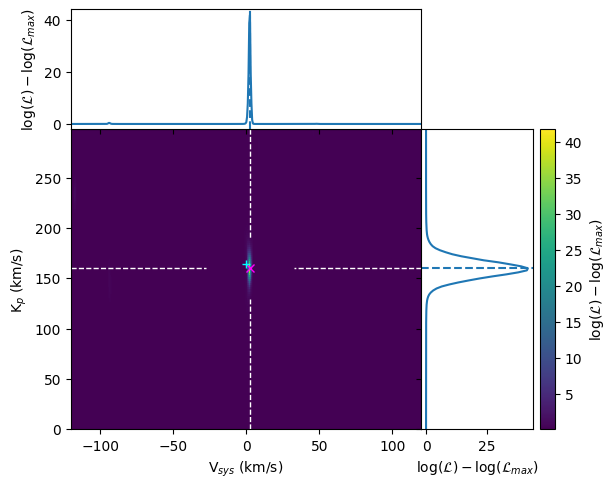

<Figure size 640x480 with 0 Axes>

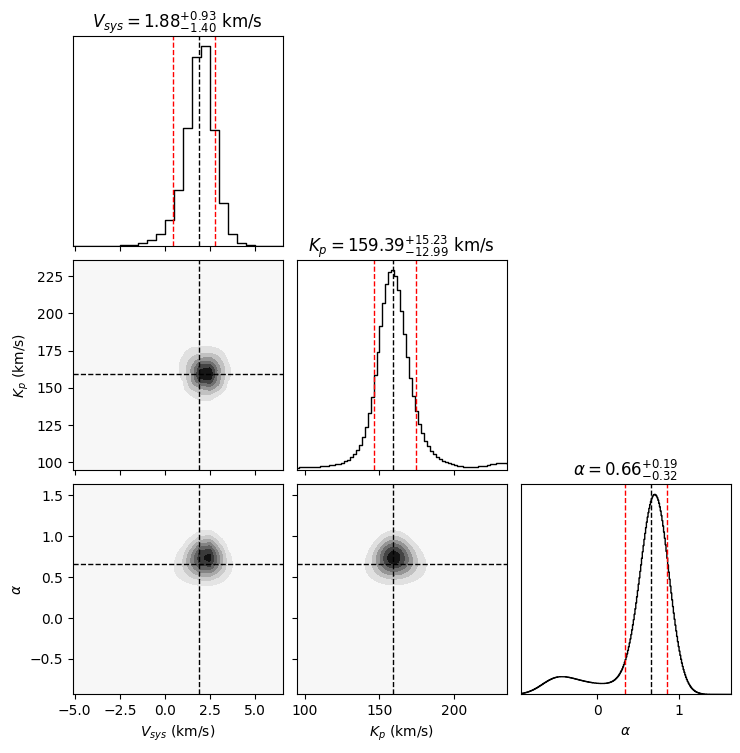

SYSREM 2

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.5 km/s
S/N = 4.31

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.5 km/s
Significance = 4.52 (α = 0.75 ± {0.17,0.17})



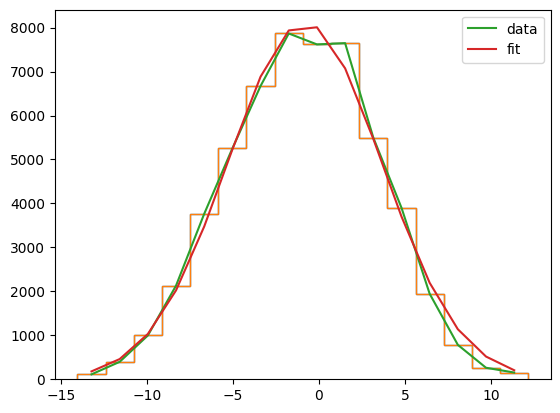

Fit parameters: 
C =  8108.113544634244 +- 148.8348550381896
X_mean = -0.8221228776896512 +- 0.09512035716872003
sigma =  -4.489498128148716 +- 0.09534667688323845




<Figure size 640x480 with 0 Axes>

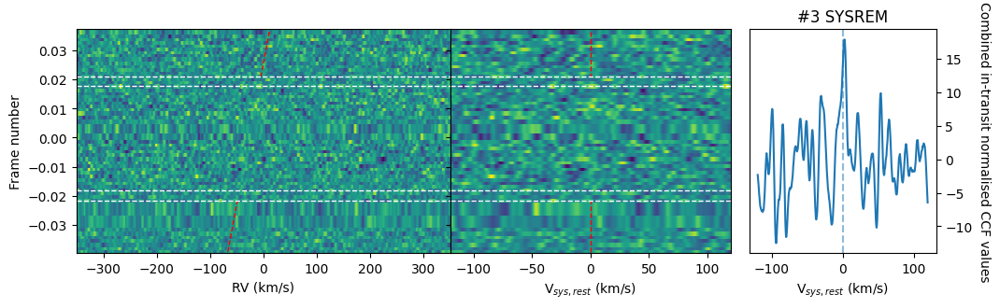

<Figure size 640x480 with 0 Axes>

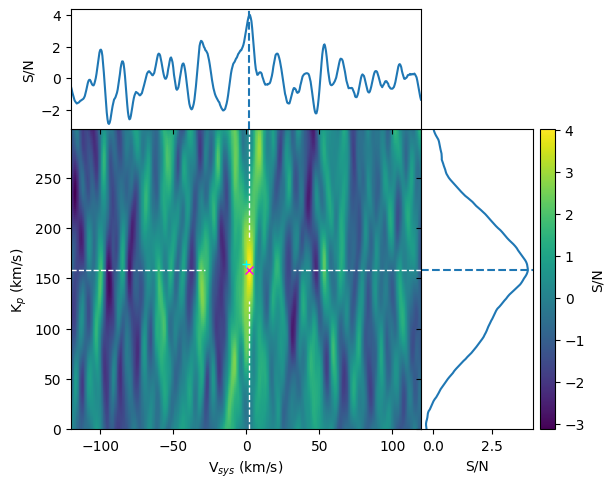

<Figure size 640x480 with 0 Axes>

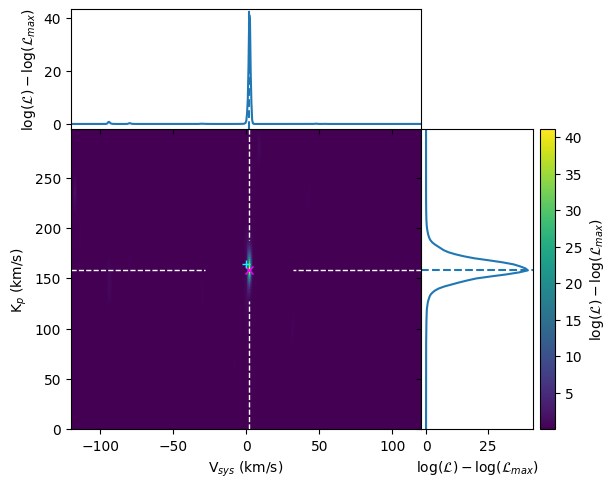

<Figure size 640x480 with 0 Axes>

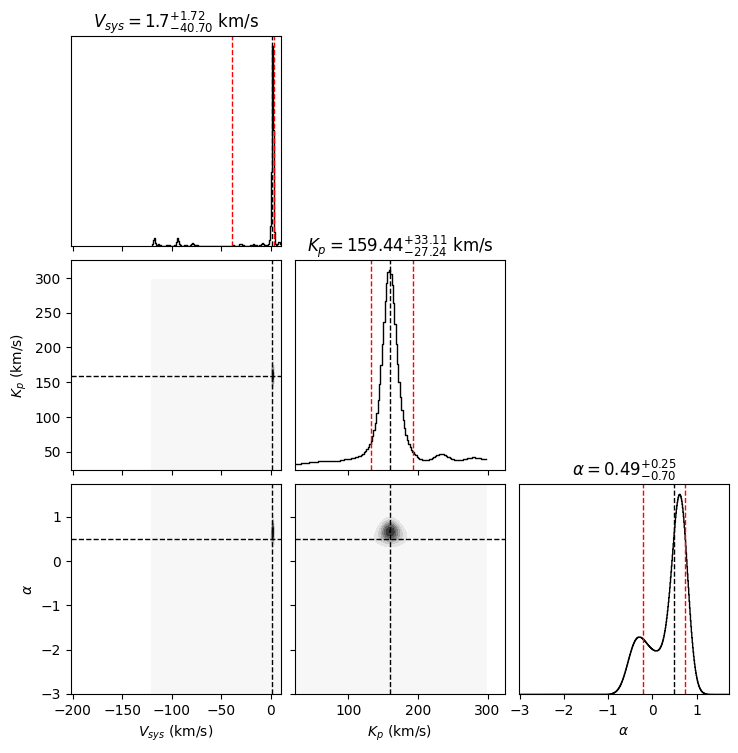

SYSREM 3

Max. peak from S/N map:
Kp = 158.0 km/s
Vsys = 2.0 km/s
S/N = 4.02

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.0 km/s
Significance = 4.15 (α = 0.68 ± {0.16,0.16})



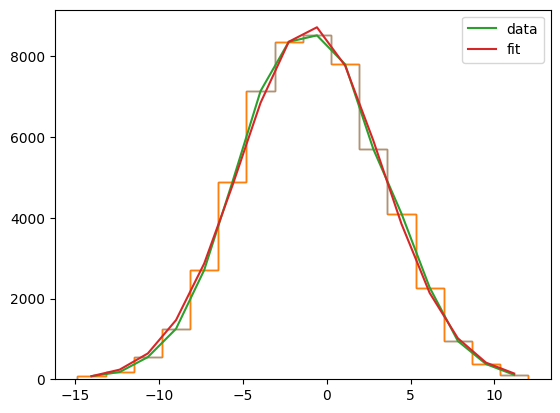

Fit parameters: 
C =  8759.168342192883 +- 95.5725470943022
X_mean = -0.9734136514269939 +- 0.05338414323741544
sigma =  -4.237750569247884 +- 0.05342194480619382




<Figure size 640x480 with 0 Axes>

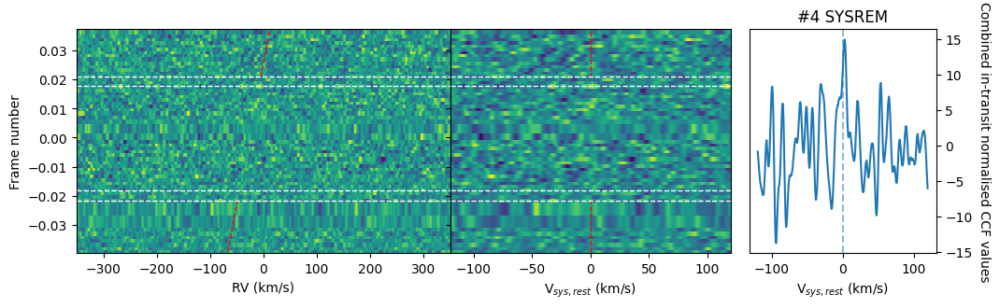

<Figure size 640x480 with 0 Axes>

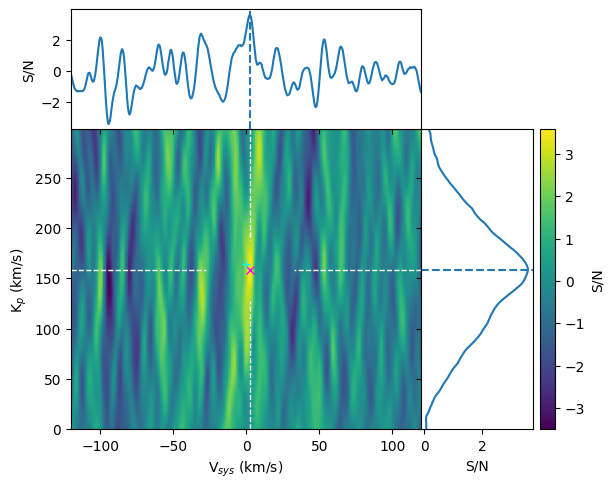

<Figure size 640x480 with 0 Axes>

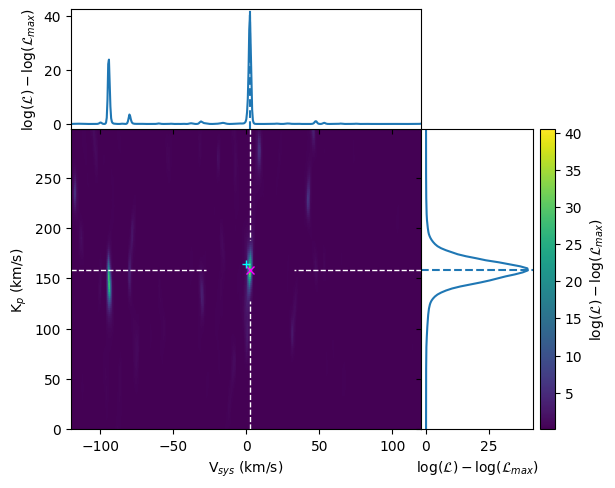

<Figure size 640x480 with 0 Axes>

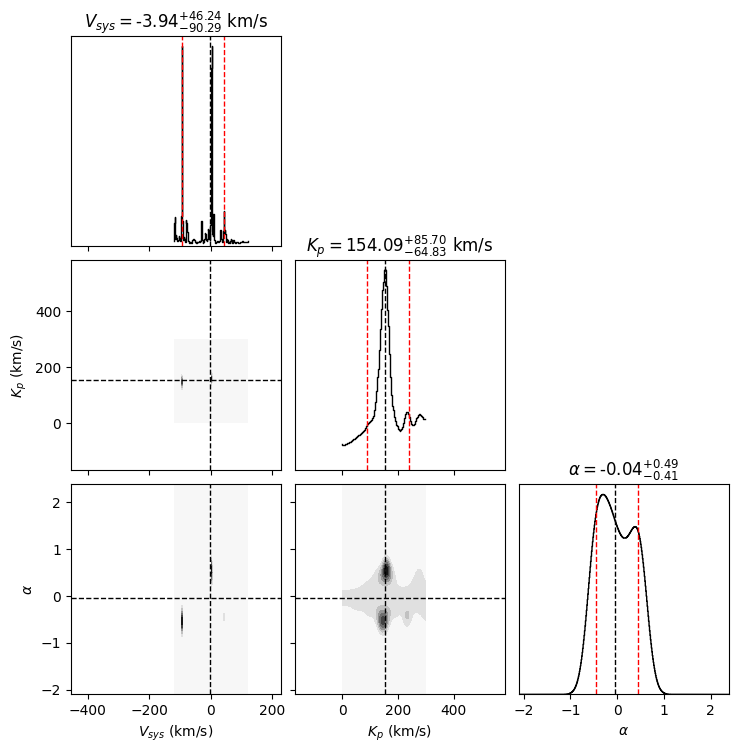

SYSREM 4

Max. peak from S/N map:
Kp = 158.0 km/s
Vsys = 2.5 km/s
S/N = 3.58

Max. peak from likelihood distribution:
Kp = 154.0 km/s
Vsys = 2.5 km/s
Significance = 3.53 (α = 0.57 ± {0.16,0.16})



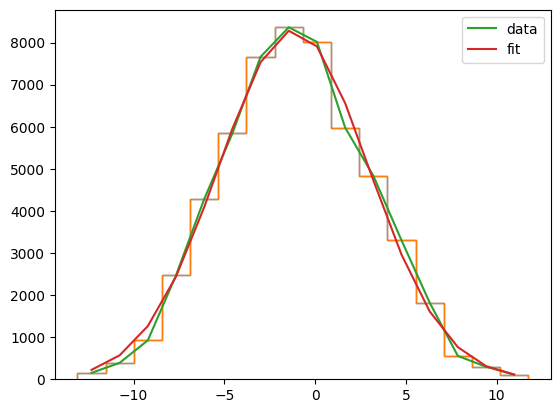

Fit parameters: 
C =  8296.95969703047 +- 138.8489452922469
X_mean = -1.1820903848898818 +- 0.08000128924484155
sigma =  -4.14139991991689 +- 0.08014889965369852




<Figure size 640x480 with 0 Axes>

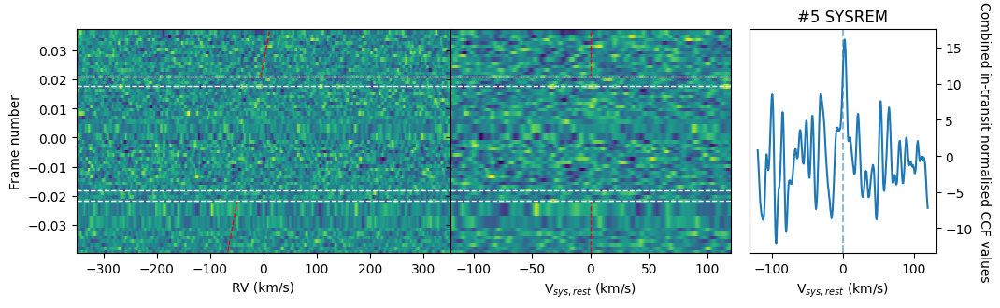

<Figure size 640x480 with 0 Axes>

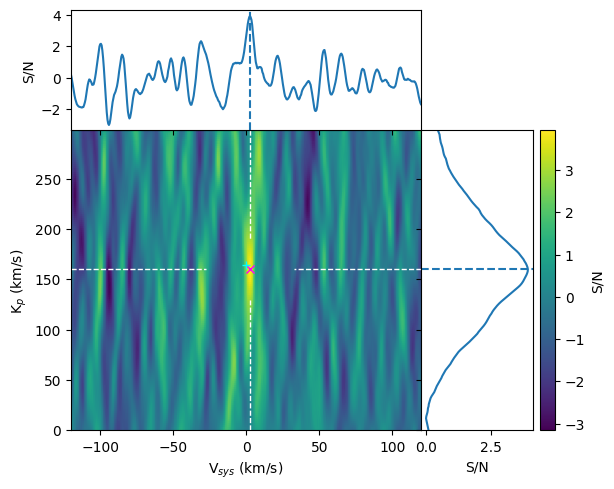

<Figure size 640x480 with 0 Axes>

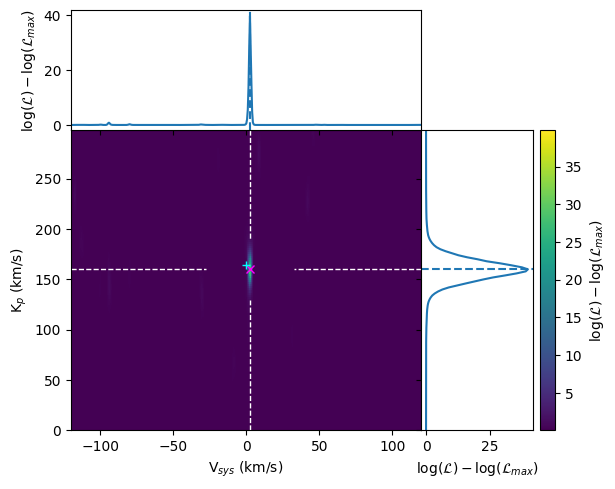

<Figure size 640x480 with 0 Axes>

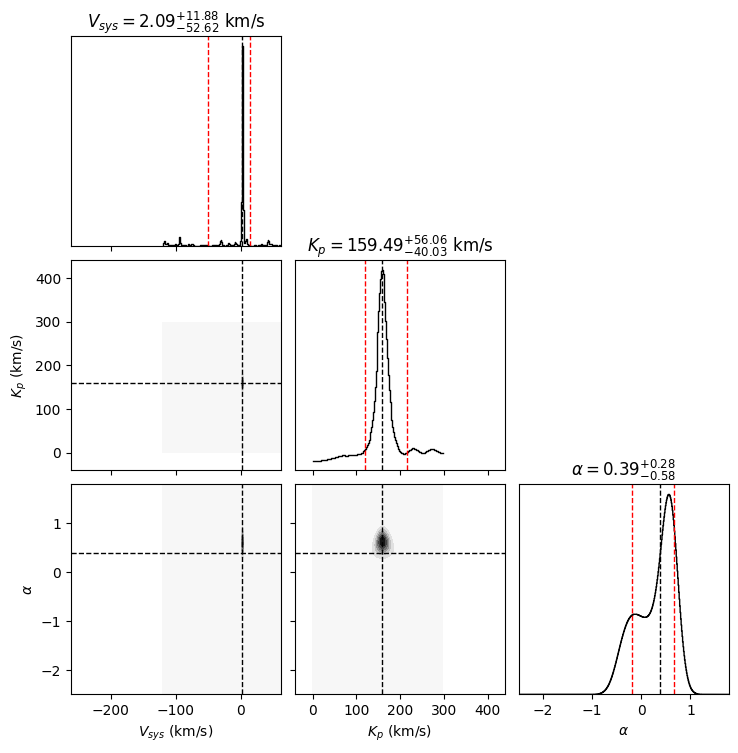

SYSREM 5

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.5 km/s
S/N = 3.94

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.5 km/s
Significance = 4.01 (α = 0.64 ± {0.16,0.16})



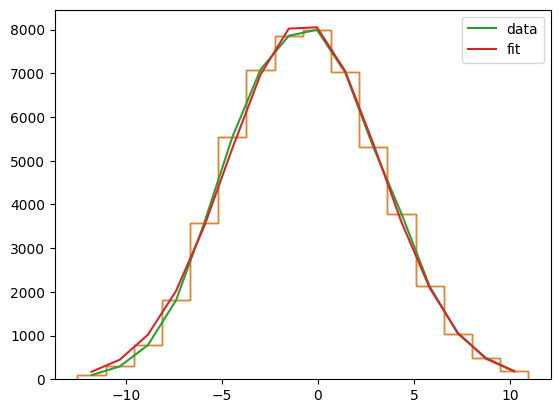

Fit parameters: 
C =  8176.357486080871 +- 83.75759155283832
X_mean = -0.7431507194718715 +- 0.046969769818014435
sigma =  3.9722882386675016 +- 0.04706251058460822




<Figure size 640x480 with 0 Axes>

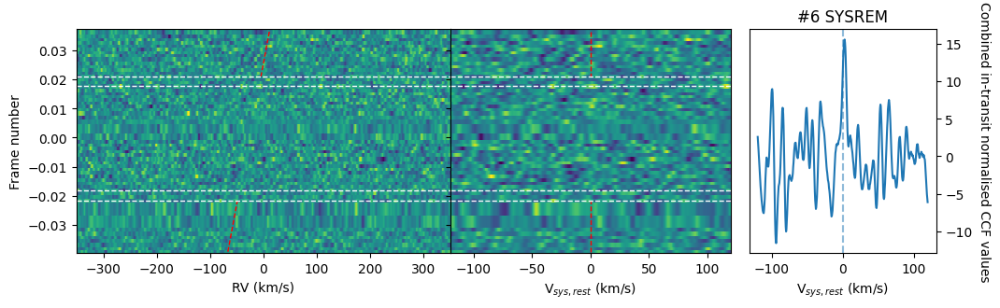

<Figure size 640x480 with 0 Axes>

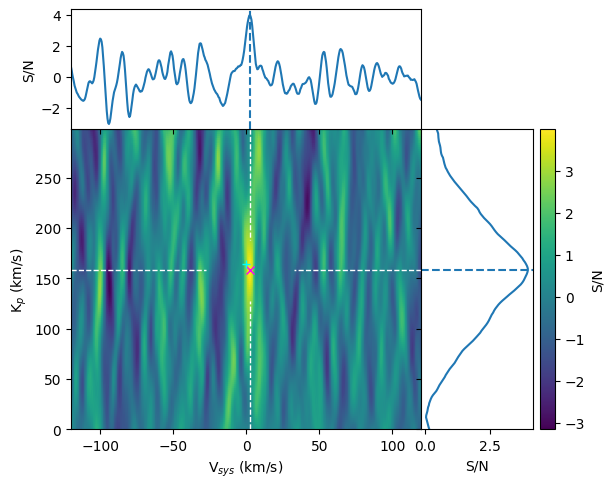

<Figure size 640x480 with 0 Axes>

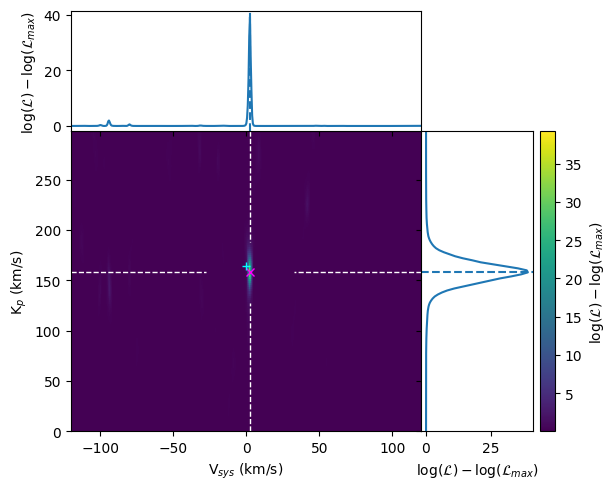

<Figure size 640x480 with 0 Axes>

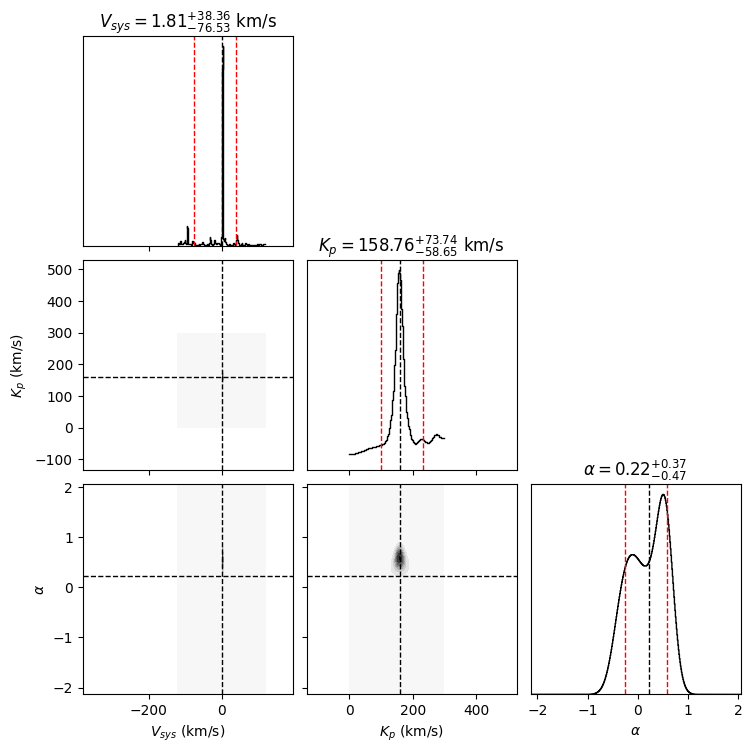

SYSREM 6

Max. peak from S/N map:
Kp = 158.0 km/s
Vsys = 2.5 km/s
S/N = 3.99

Max. peak from likelihood distribution:
Kp = 158.0 km/s
Vsys = 2.5 km/s
Significance = 3.84 (α = 0.60 ± {0.16,0.16})



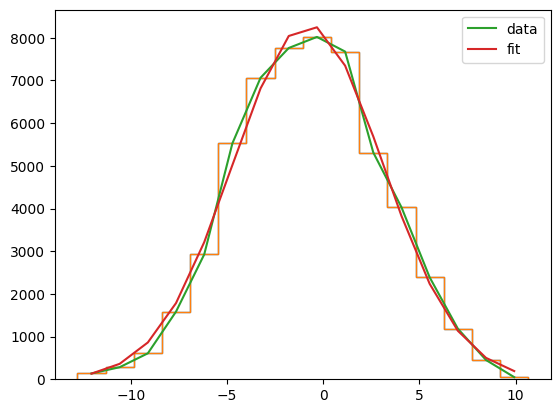

Fit parameters: 
C =  8306.523114790736 +- 155.00270541653165
X_mean = -0.8026088798454678 +- 0.08422230652095092
sigma =  3.9099122885870923 +- 0.08436149301614537




<Figure size 640x480 with 0 Axes>

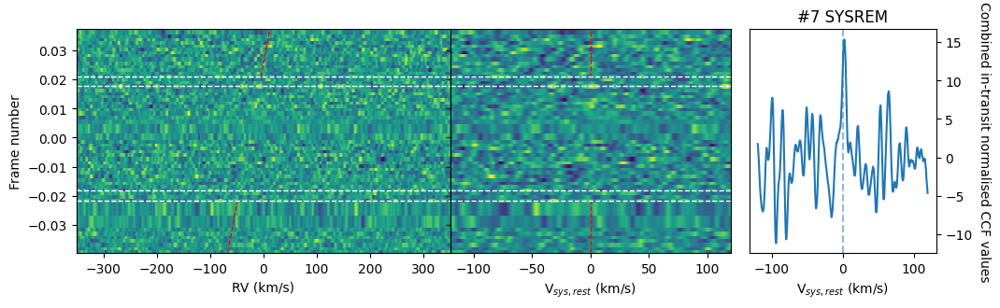

<Figure size 640x480 with 0 Axes>

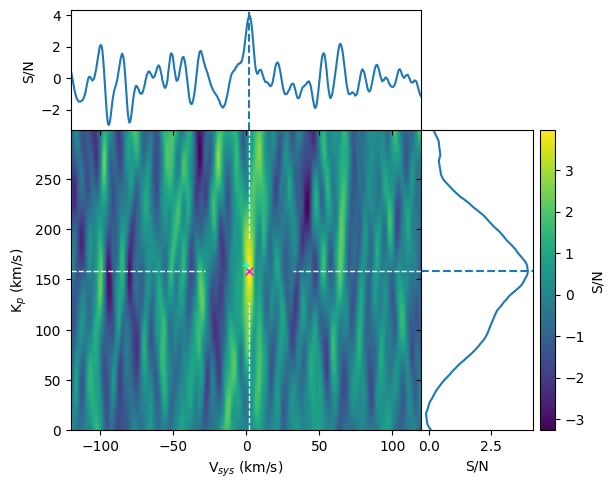

<Figure size 640x480 with 0 Axes>

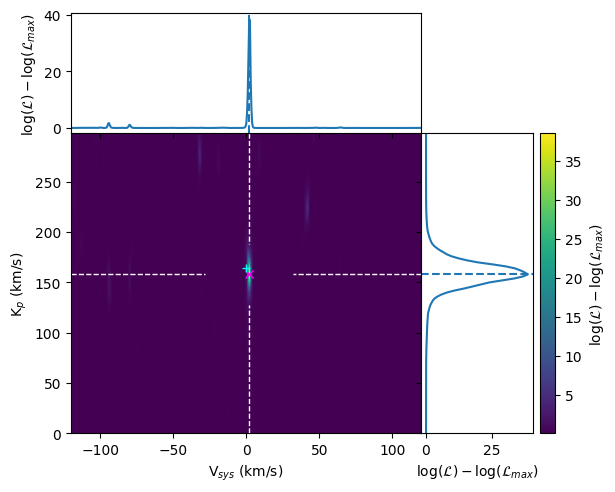

<Figure size 640x480 with 0 Axes>

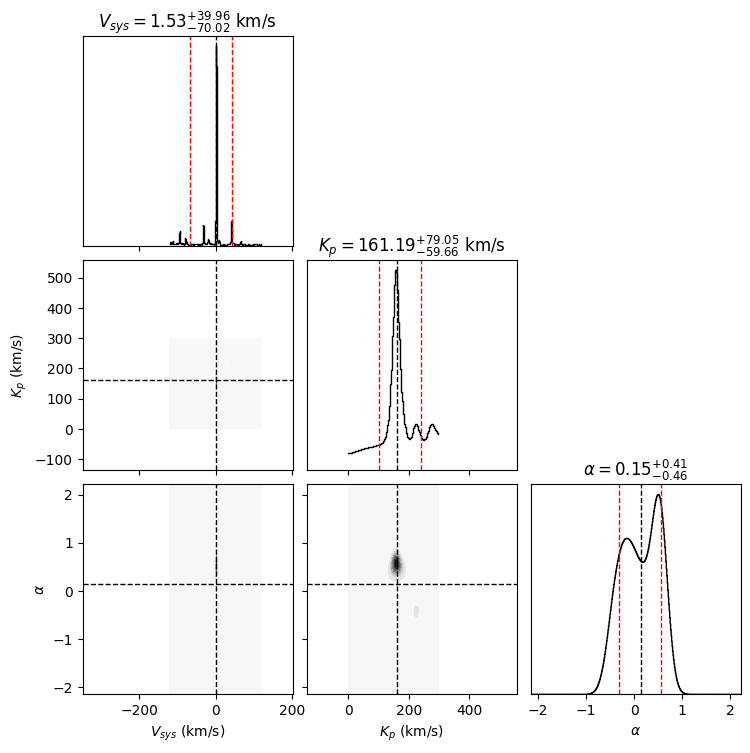

SYSREM 7

Max. peak from S/N map:
Kp = 158.0 km/s
Vsys = 2.0 km/s
S/N = 3.96

Max. peak from likelihood distribution:
Kp = 158.0 km/s
Vsys = 2.0 km/s
Significance = 3.81 (α = 0.59 ± {0.15,0.15})



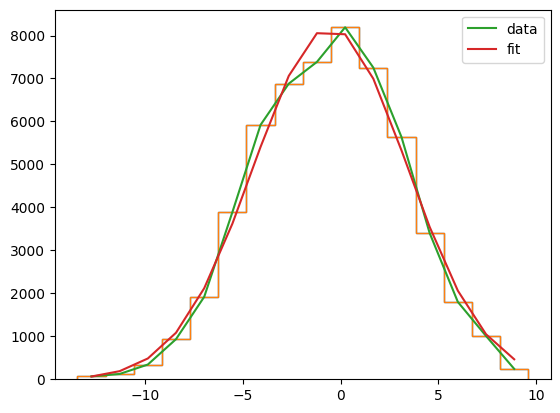

Fit parameters: 
C =  8178.827252650192 +- 171.71501215429672
X_mean = -0.5274921858693326 +- 0.09527257940294047
sigma =  -3.9327124131457754 +- 0.09580639860128182




<Figure size 640x480 with 0 Axes>

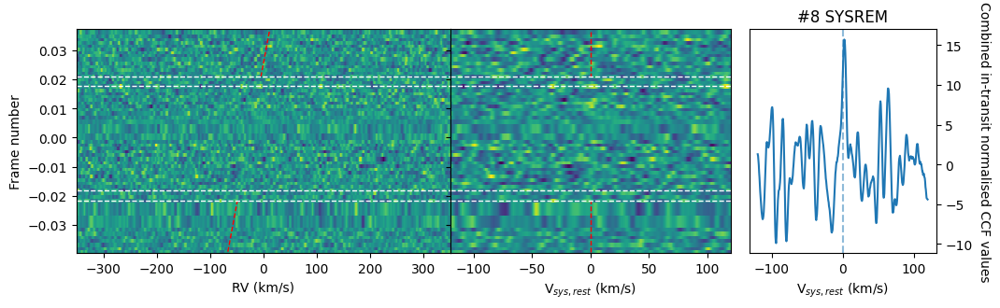

<Figure size 640x480 with 0 Axes>

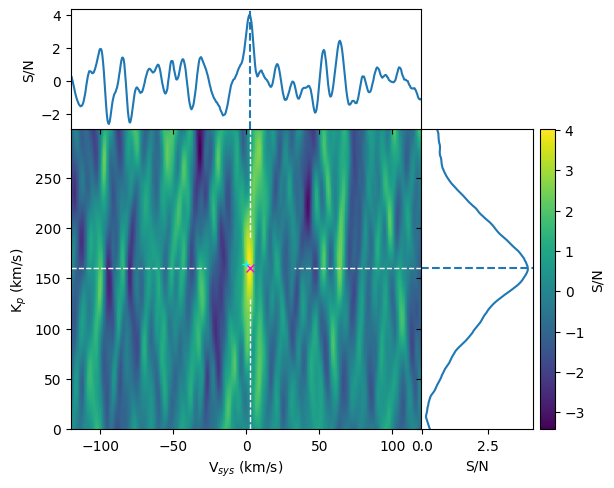

<Figure size 640x480 with 0 Axes>

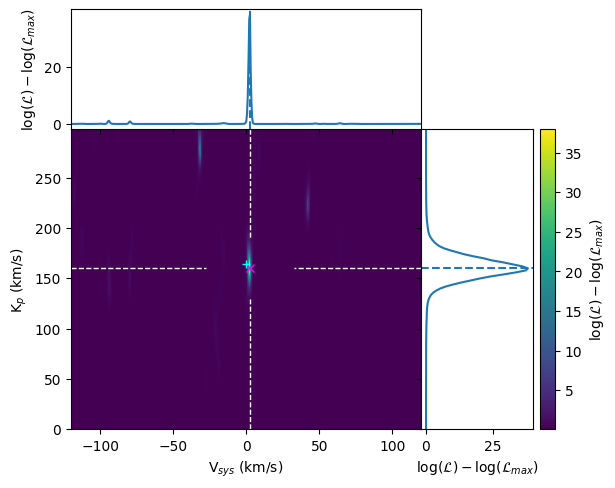

<Figure size 640x480 with 0 Axes>

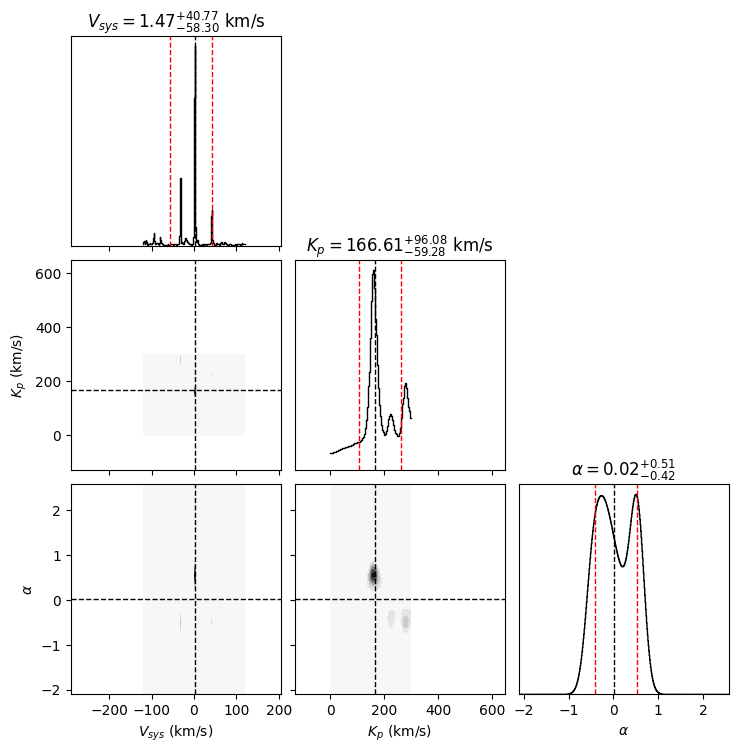

SYSREM 8

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.5 km/s
S/N = 4.02

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.0 km/s
Significance = 3.79 (α = 0.57 ± {0.15,0.15})



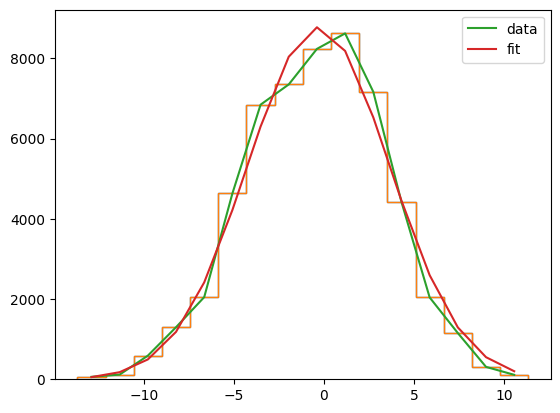

Fit parameters: 
C =  8778.04429758799 +- 248.1710513246269
X_mean = -0.2962063253752372 +- 0.12910193712635537
sigma =  -3.955436450382315 +- 0.1292426060411231




<Figure size 640x480 with 0 Axes>

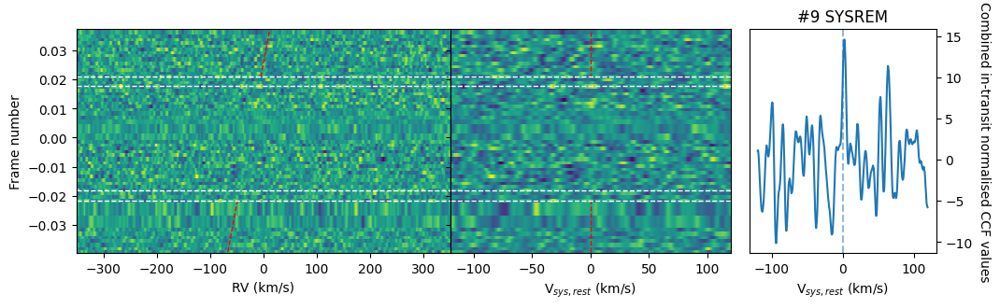

<Figure size 640x480 with 0 Axes>

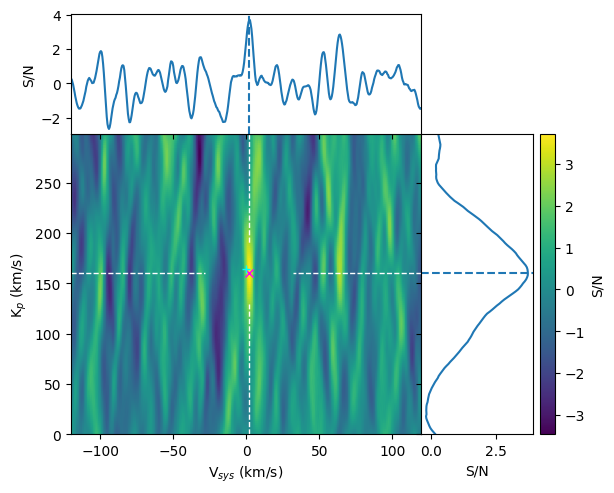

<Figure size 640x480 with 0 Axes>

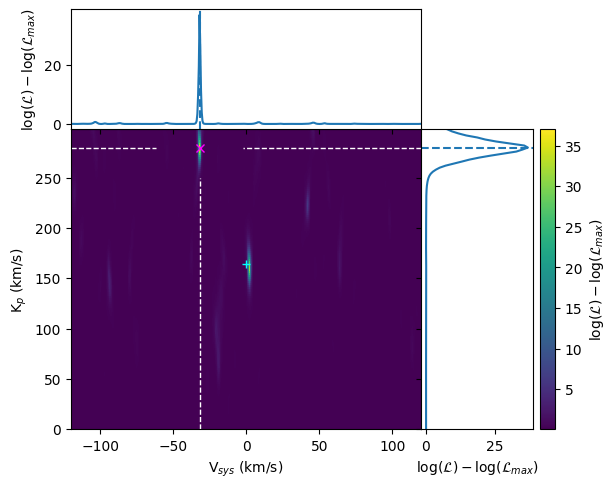

<Figure size 640x480 with 0 Axes>

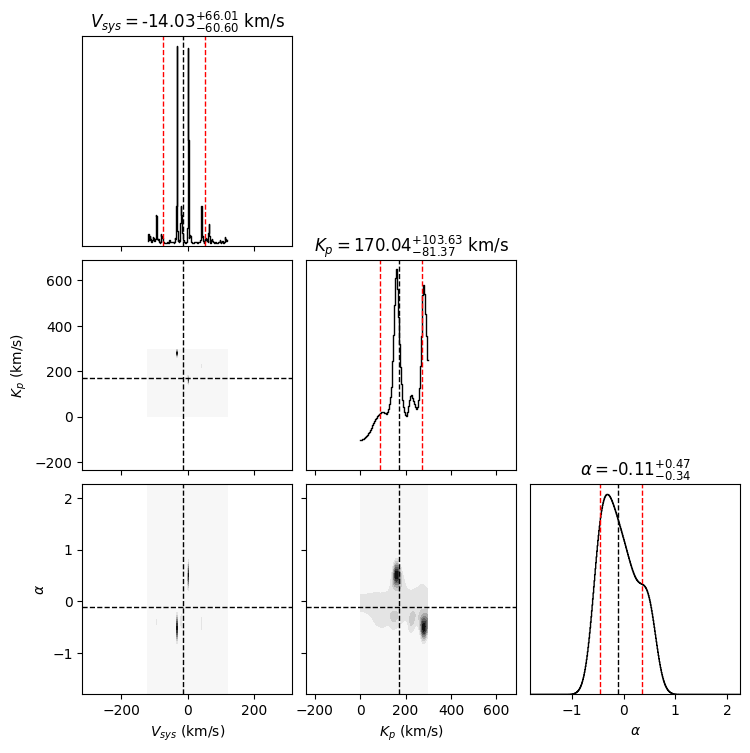

SYSREM 9

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.0 km/s
S/N = 3.7

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = -32.0 km/s
Significance = 1.32 (α = 0.19 ± {0.15,0.15})



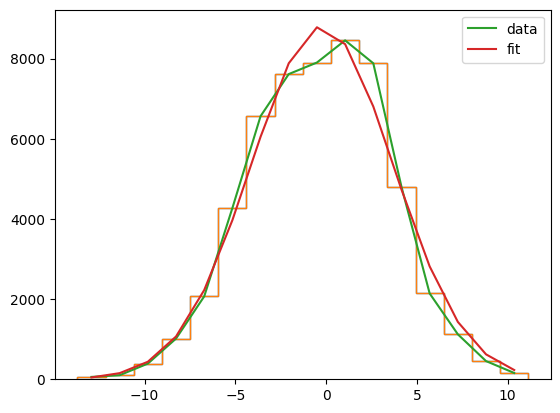

Fit parameters: 
C =  8805.743315093347 +- 277.966822201848
X_mean = -0.210926480496314 +- 0.14282220156354192
sigma =  -3.919265011787724 +- 0.14301508837320623




<Figure size 640x480 with 0 Axes>

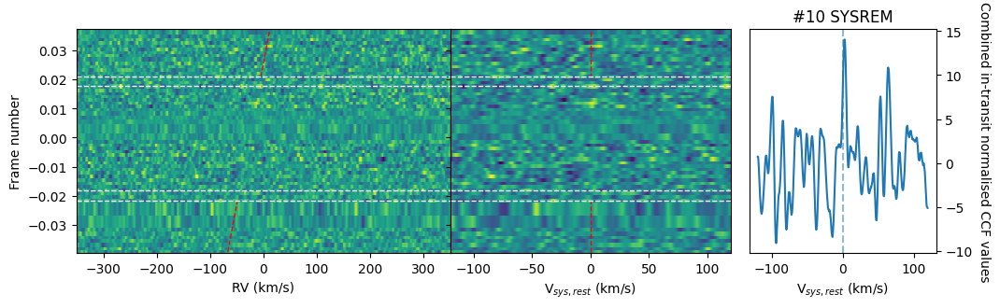

<Figure size 640x480 with 0 Axes>

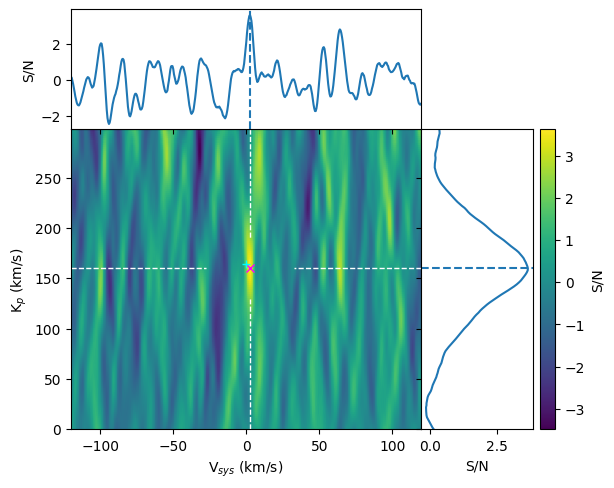

<Figure size 640x480 with 0 Axes>

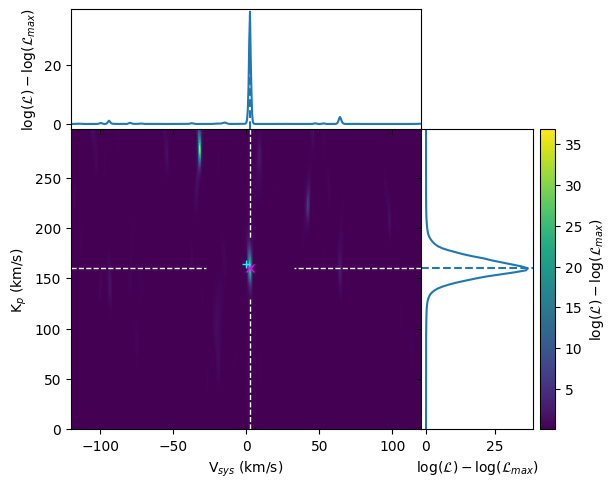

<Figure size 640x480 with 0 Axes>

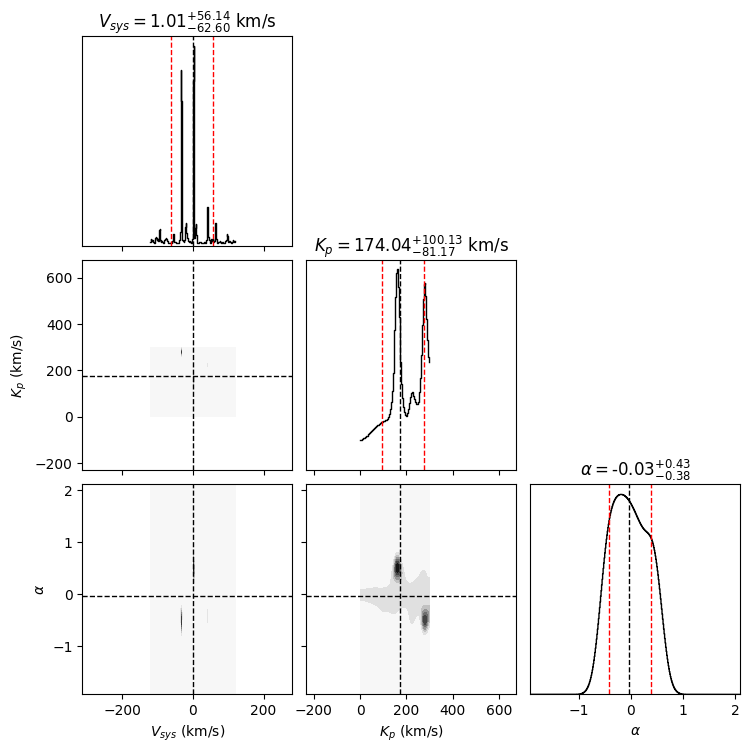

SYSREM 10

Max. peak from S/N map:
Kp = 160.0 km/s
Vsys = 2.5 km/s
S/N = 3.64

Max. peak from likelihood distribution:
Kp = 160.0 km/s
Vsys = 2.5 km/s
Significance = 3.63 (α = 0.53 ± {0.15,0.15})



<Figure size 640x480 with 0 Axes>

In [6]:
# 56 frames

sampling = 1.30
RV_sample = np.arange(-350,350,sampling)    # in km/s
Kp_sample = np.arange(0,300,2.0)       # in km/s
Vsys_sample = np.arange(-120,120,0.5)       # in km/s
Kp_planet = 164.27                          # in km/s (calculated from formula given in Exoplanets (Seager, 2010))
Vsys_planet = -17.91                        # in km/s (calculated from stellar RV analysis)
A_sample = np.arange(-5.,5.,0.01)
sys_num = 10

# these are not used if eccentric=False
e, w = 0.2529, 1.873681195169868
JDUTC = astropy.time.Time(63208.799999999814+2400000, format='jd', scale='utc') # epoch of periastron in JD (Ment+ 2018) observed in Keck
Tp = barycorrpy.utc_tdb.JDUTC_to_BJDTDB(JDUTC,starname='HD 149026', lat=19.82833333, longi=-155.47833333, alt=4160.)[0][0] - 2400000

wvdat,fluxdat,errdat,adat = wave_data,flux_data,error_data,a_data
snmap_h2o,snmap_h2o_std, cc_total,cc_shifted,cc_combine = detect_molecules(wvdat,fluxdat,errdat,adat,wave_modelmol,flux_modelmol,sys_num+1,carm_order,
                RV_sample,Kp_sample,Vsys_sample,A_sample,
                Kp_planet,Vsys_planet,transit_weight,out_transit_mask,rvcor,phase,e,w,Tp,std_brogi=True,eccentric=False,plot=True)


# Injection Test

In [8]:
class Injection():

    def __init__(self,spectrum_path,Oliva_OH_path,Oliva_nonOH_path,Rousselot_OH_path,
                 sum_order,bad_frame,bad_order,telluric_order,ref_cont,
                 maskpix_value,resolution,edge_pix,factor_emission,factor_telluric,factor_outliers,sigma_threshold,
                 threshold_heavy_low,threshold_nonheavy_low,threshold_heavy_ratio,threshold_nonheavy_ratio,
                 binmedfil,bingauss,continuum_minimum,
                 transit_weight,
                 **kwargs):
        
        self.data_path = spectrum_path
        self.sum_order = sum_order
        self.bad_frame = bad_frame
        self.bad_order = bad_order
        self.tel_order = telluric_order
        self.thold_hvy_low = threshold_heavy_low
        self.thold_nhvy_low = threshold_nonheavy_low
        self.thold_hvy_rat = threshold_heavy_ratio
        self.thold_nhvy_rat = threshold_nonheavy_ratio
        self.ref_cont = ref_cont
        self.maskpix_val = maskpix_value
        self.edge_pix = edge_pix
        self.sig = sigma_threshold
        self.res = resolution
        self.fac_emis = factor_emission
        self.fac_tel = factor_telluric
        self.fac_out = factor_outliers
        self.binmedfil = binmedfil
        self.bingauss = bingauss
        self.min_cont = continuum_minimum
        self.OH_oliva = Oliva_OH_path
        self.nonOH_oliva = Oliva_nonOH_path
        self.OH_rousselot = Rousselot_OH_path
        self.transit_weight = transit_weight
        self.data_info = {}
        self.__dict__.update(kwargs)

    # function for masking emission wavelengths
    def emission(self,wl,emis):
        wv = np.array(emis)[(wl[0] < emis) * (wl[-1] > emis)]
        mask = (np.prod(np.abs(wl - wv[:,np.newaxis]) > wv[:,np.newaxis]/self.res*self.fac_emis,axis=0)) == 1 # masking regions around the emission line bounded by eta*(lambda/R)
        return mask

    # function for opening and reading the spectrum FITS file
    def data_prep(self):

        dat_file = []
        lst = os.listdir(self.data_path)
        lst.sort()
        for x in lst:
            if not x.startswith('.') and x.endswith('.fits'):
                dat_file.append(x)

        # exclude bad frames
        [dat_file.pop(frame) for frame in self.bad_frame]

        flux,wave,error = [],[],[]
        exptime,snr,airmass,mjd,jd,bjd,rvcor,seeing,humid,temp = [],[],[],[],[],[],[],[],[],[]

        for idx,frame in enumerate(dat_file):
            spec = fits.open(str(self.data_path)+str(frame))

            flux_temp,wave_temp,error_temp = [],[],[]
            for order in range(self.sum_order):
                flux_temp.append(spec[1].data[order]) # flux
                wave_temp.append(spec[4].data[order]) # wavelength
                error_temp.append(spec[3].data[order]) # photon(+shot) noise
            flux.append(flux_temp)
            wave.append(wave_temp)
            error.append(error_temp)

            airmass.append(spec[0].header["AIRMASS"]) # airmass at the observation start
            exptime.append(spec[0].header["EXPTIME"]) # exposure time
            mjd.append(spec[0].header["HIERARCH CARACAL MJD-OBS"]) # MJD at the observation start
            rvcor.append(spec[0].header['HIERARCH CARACAL BERV']) # barycentric correction in to observer rest-frame
            bjd.append(spec[0].header['HIERARCH CARACAL BJD']) # BJD at the observation start
            jd.append(spec[0].header['HIERARCH CARACAL JD']) # JD at the observations start
            humid.append(spec[0].header['HIERARCH CAHA GEN AMBI RHUM']) # relative humidity
            temp.append(spec[0].header['HIERARCH CAHA GEN AMBI TEMPERATURE']) # ambient temperature

            if frame.endswith("A.fits"):
                snr_temp = []
                for i in range(self.sum_order):
                    snr_temp.append(spec[0].header["HIERARCH CARACAL FOX SNR "+str(i)]) # star SNR per pixel from CARACAL
                snr.append(snr_temp)
            elif frame.endswith("B.fits"):
                snr_temp = []
                for i in range(self.sum_order):
                    snr_temp.append(spec[0].header["HIERARCH CARACAL LXT SNR "+str(i)]) # sky SNR per pixel from CARACAL
                snr.append(snr_temp)

        flux,wave,error = np.array(flux),np.array(wave),np.array(error)
        print(flux.shape)
        self.tot_init = flux.shape[2]*flux.shape[1]

        flux_star = np.zeros((flux.shape[1],flux.shape[0],flux.shape[2])) # order x frame x wavelength
        wave_star = flux_star.copy()
        error_star = flux_star.copy()
        for order in range(flux_star.shape[0]):
            flux_star[order] = flux[:,order,:]
            wave_star[order] = wave[:,order,:]
            error_star[order] = error[:,order,:]

        ref_spec = np.argmax(np.mean(snr,axis=1)) # reference spectrum taken as spectrum with highest mean SNR (over orders)
        self.ref_spec = ref_spec
        if self.__dict__['plot_prep']:

            # plot humidity and airmass
            fig,(ax1,ax2) = plt.subplots(1,2,figsize=(20,5))
            ax1.scatter(np.arange(len(bjd)),humid)
            ax1.set_title('Humidity')
            ax2.scatter(np.arange(len(bjd)),airmass)
            ax2.set_title('Airmass')
            print('Average humidity is '+str(np.mean(humid)))
            plt.show()
            plt.clf()

            plt.figure(figsize=(15,10))
            print('Mean SNR over all frames and orders: '+str(np.mean(snr)))
            print('Frame with the highest SNR: '+str(np.argmax(np.mean(snr,axis=1)))+' ('+str(dat_file[np.argmax(np.mean(snr,axis=1))])+')')

            # plot average SNR over frames for every orders
            plt.subplot(211)
            plt.scatter(np.arange(len(snr[0])),np.mean(snr,axis=0))
            plt.plot(np.mean(snr,axis=0))
            plt.axhline(y=50,ls='--',lw=1)
            plt.ylabel("snr")
            plt.xlabel("order")
            plt.title('SNR')

            # plot average SNR over orders for every frames
            plt.subplot(212)
            plt.scatter(np.arange(len(snr)),np.mean(snr,axis=1))
            plt.plot(np.mean(snr,axis=1))
            plt.ylabel("snr")
            plt.xlabel("frame")
            plt.title('SNR')

            plt.show()
            plt.clf()

            plt.figure(figsize=(15,5),dpi=300)
            for order in range(len(flux_star)):
                if order not in self.bad_order:
                    plt.plot(wave_star[order][ref_spec],flux_star[order][ref_spec],color='black',lw=1)
                else:
                    plt.plot(wave_star[order][ref_spec],flux_star[order][ref_spec],color='gray',lw=1)
                    # plt.fill_betweenx(np.arange(0.1),wave_star[order][41][0],wave_star[order][41][-1],color='green',alpha=0.4,edgecolor='none')
                
            plt.ylabel('Arbitrary flux')
            plt.xlabel(r'Wavelength ($\AA$)')
            plt.show()
            plt.clf()

        self.data_info['airmass'] = np.asarray(airmass)
        self.data_info['humid'] = np.asarray(humid)
        self.data_info['exptime'] = np.asarray(exptime)
        self.data_info['SNR'] = np.asarray(snr)
        self.data_info['MJD'] = np.asarray(mjd)
        self.data_info['JD'] = np.asarray(jd)
        self.data_info['BJD'] = np.asarray(bjd)
        self.data_info['RV_cor'] = np.asarray(rvcor)
        self.data_info['temperature'] = np.asarray(temp)
        return flux_star, error_star, wave_star, snr, airmass, humid, self.data_info

    # function for reducing the data (includes normalizing, masking, and uncertainty estimation)
    def normalization_and_masking(self):

        flux_temp, error, wave, snr, airmass, humid, self.data_info = self.data_prep()
        flux = flux_temp.copy()
        ref_spec = self.ref_spec
        ref_cont = self.ref_cont

        for order in range(flux.shape[0]):

            ######################################## Spectrum normalizing ########################################
            
            # plot photon noise from CARACAL
            if self.__dict__['plot_norm']:
                plt.figure(figsize=(25,5))
                plt.subplot(131)
                plt.plot(wave[order][ref_spec],error[order][ref_spec])

                plt.subplot(132)
                plt.plot(wave[order][ref_spec],flux[order][ref_spec],linewidth=1)
                plt.plot(wave[order][ref_spec],ref_cont[0].data[order])
                plt.title("order #"+str(order))

            # normalizing with pseudo-continuum
            error[order] /= ref_cont[0].data[order]
            flux[order] /= ref_cont[0].data[order]

            for frame in range(len(flux[order])):

                # to minimize contributions from outliers and spectral lines to the median computation
                medflux = np.nanmedian(flux[order][frame][500:-500][np.argsort(flux[order][frame][500:-500])][500:])

                # removing variations between frames
                error[order][frame] /= medflux
                flux[order][frame] /= medflux

            # plot IRAF pseudo-continuum fitted using continuum task
            if self.__dict__['plot_norm']:
                plt.subplot(133)
                plt.plot(wave[order][ref_spec],flux[order][ref_spec])
                plt.show()
                plt.clf()

        ######################################## Nan and negative values masking ########################################

        if self.__dict__['print_neg']:
            for order in range(len(flux)):
                print('order '+str(order)+', negative_count = '+str(np.count_nonzero(flux[order] < 0))\
                +', nan_count = '+str(np.count_nonzero(np.isnan(flux[order]))))

        mask = ((np.prod(~np.isnan(flux),axis=1))==1) * ((np.prod(flux>=0,axis=1))==1)
        mask = np.repeat(mask[:,np.newaxis,:],repeats=[flux.shape[1]],axis=1)
        flux[~mask],error[~mask] = self.maskpix_val,np.inf

        ######################################## Removing bad orders ########################################

        flux = np.delete(flux,self.bad_order,0)
        error = np.delete(error,self.bad_order,0)
        wave = np.delete(wave,self.bad_order,0)
        self.carm_order = np.delete(np.arange(flux_temp.shape[0]),self.bad_order,0)

        ######################################## Sky emission masking ########################################

        # atlas from Oliva+ (2015)
        OH_1st,OH_2nd,nonOH = [],[],[]
        for i in range(len(self.OH_oliva)):
            OH_1st.append(self.OH_oliva[i][0]) # first OH doublet
            OH_2nd.append(self.OH_oliva[i][2]) # second OH doublet
        for i in range(len(self.nonOH_oliva)):
            nonOH.append(self.nonOH_oliva[i][0]) # non-OH emission

        # atlas from Rousselot+ (2000)
        OH_rous = []
        for i in range(len(self.OH_rousselot)):
            OH_rous.append(self.OH_rousselot[i][0])

        for order in range(len(flux)):
            
            # only use a single frame to mask as sky emission wavelengths are not changing over time
            mask = self.emission(wave[order][0],OH_1st) # OH 1st doublet
            mask *= self.emission(wave[order][0],OH_2nd) # OH 2nd doublet
            mask *= self.emission(wave[order][0],nonOH) # non-OH
            mask *= self.emission(wave[order][0],OH_rous) # atlas from Rousselot+ (2000)

            error[order][:,~mask] = np.inf
            flux[order][:,~mask] = self.maskpix_val

        if self.__dict__['plot_emis']:
            for idx,order in enumerate(self.carm_order):

                plt.figure(figsize=(20,5))
                for frame in range(len(flux[idx])):
                    plt.plot(wave[idx][frame][flux[idx][frame]!=0],flux[idx][frame][flux[idx][frame]!=0],'black',linewidth=1,alpha=1)
                plt.title(order)

                for wv in OH_1st:
                    plt.axvline(x=wv,linewidth=1,alpha=0.7,c='b')
                for wv in OH_2nd:
                    plt.axvline(x=wv,linewidth=1,alpha=0.7,c='b')
                for wv in nonOH:
                    plt.axvline(x=wv,linewidth=1,alpha=0.7,c='r')
                for wv in OH_rous:
                    plt.axvline(x=wv,linewidth=1,alpha=0.7,c='cyan')
                plt.xlim(wave[idx][ref_spec][0],wave[idx][ref_spec][-1])

                plt.show()
                plt.clf()

        ######################################## Bad regions masking (SUBJECT TO CHANGE) ########################################

        for order in range(len(self.carm_order)):

            if self.__dict__['plot_bad_reg']:
                plt.figure(figsize=(20,5))
                for frame in range(flux.shape[1]):
                    plt.scatter(wave[order][frame][flux[order][frame]!=0],flux[order][frame][flux[order][frame]!=0],s=1,c='red')
            
            mask = flux[order][0] < np.inf
            mask[:self.edge_pix] = False                                        # edge-effects of CARMENES orders (Sanchez-Lopez+ 2019)
            mask[-self.edge_pix:] = False                                       # edge-effects of CARMENES orders (Sanchez-Lopez+ 2019)
            if order == 21: mask[-1000:] = False                                # low SNR regions
            elif order == 20: mask[-350:] = False                               # low SNR regions
            elif order == 2 or order == 3 or order == 4: mask[:545] = False     # un-natural bumps in bluest parts

            error[order][:,~mask] = np.inf
            flux[order][:,~mask] = self.maskpix_val

            if self.__dict__['plot_bad_reg']:
                for frame in range(flux.shape[1]):
                    plt.scatter(wave[order][frame][flux[order][frame]!=0],flux[order][frame][flux[order][frame]!=0],s=1,c='blue')
                plt.title('order '+str(self.carm_order[order]))
                plt.show()
                plt.clf()

        ######################################## Outliers masking ########################################
        
        for idx,order in enumerate(self.carm_order):

            if self.__dict__['plot_out']:
                fig,ax = plt.subplots(1,3,figsize=(15,5))
                for frame in range(len(flux[idx])):
                    ax[0].plot(wave[idx][frame][flux[idx][frame]>0],flux[idx][frame][flux[idx][frame]>0])

            # removing cosmic rays (cosmic rays behaviour only seen in one or two frames hence it's treated differently)
            flux_temp = np.copy(flux[idx])
            for wave_bin in range(flux_temp.shape[1]):
                c = sigmaclip(flux_temp[:,wave_bin],low=self.sig,high=self.sig)[0]
                flux[idx][:,wave_bin],error[idx][:,wave_bin] = (self.maskpix_val,np.inf) if ~(np.abs(flux_temp[:,wave_bin]-np.mean(c))<self.sig*np.std(c)).all()\
                else (flux[idx][:,wave_bin],error[idx][:,wave_bin])

            # identify outliers following Gibson+ (2020) but instead using std of the residual
            wv,fl,er,maskpix = mask_pix(wave[idx],flux[idx],error[idx])
            simple_model = np.outer(np.median(fl,axis=1),np.median(fl,axis=0))/np.median(fl)
            residual = fl - simple_model
            mask = np.abs(residual[0]) > -1
            for frame in range(fl.shape[0]):
                fit = np.polyfit(wv[frame], residual[frame], 10) # fit with 10th order polynomial
                fit_coeff = np.poly1d(fit)
                fit_continuum = fit_coeff(wv[frame])
                mask *= (residual[frame] < fit_continuum + self.sig*np.std(residual[frame])) *  (residual[frame] > fit_continuum - self.sig*np.std(residual[frame]))

                if self.__dict__['plot_out'] and frame == self.ref_spec:
                    ax[1].plot(wv[frame],residual[frame])
                    ax[1].plot(wv[frame],fit_continuum)
                    ax[1].plot(wv[frame],fit_continuum+self.sig*np.std(residual[frame]))
                    ax[1].plot(wv[frame],fit_continuum-self.sig*np.std(residual[frame]))
            mask = ~mask

            # identify line center by median centering
            if True in mask:
                wv_len = wv[0,mask]
                wv_idx,wv_med,wv_temp = 0,[],[wv_len[0]]
                if len(wv_len) == 1:
                    wv_med.append(wv_len[0])
                else:
                    while wv_idx < len(wv_len)-1:
                        if wv_len[wv_idx+1]-wv_len[wv_idx] < wv_len[wv_idx]/self.res*self.fac_out/2:
                            wv_temp.append(wv_len[wv_idx+1])
                            wv_idx += 1
                        else:
                            wv_med.append(np.median(wv_temp))
                            wv_temp = [wv_len[wv_idx+1]]
                            wv_idx += 1
                    wv_med.append(wv_len[-1])

                # masking regions around outlier
                wv_med = np.array(wv_med)
                maskcen = ~((np.prod(np.abs(wv[0]-wv_med[:,np.newaxis]) > wv_med[:,np.newaxis]/self.res*self.fac_out/2,axis=0)) == 1)
                fl[:,maskcen],er[:,maskcen] = self.maskpix_val, np.inf
            else:
                fl[:,mask],er[:,mask] = self.maskpix_val, np.inf

            # assign the new value to the original array
            for frame in range(fl.shape[0]):
                error[idx][frame][maskpix==True] = er[frame]
                flux[idx][frame][maskpix==True] = fl[frame]
                
                if self.__dict__['plot_out']:
                    ax[0].set_title('order #'+str(order))
                    ax[2].plot(wave[idx][frame][flux[idx][frame]>0],flux[idx][frame][flux[idx][frame]>0])

        ######################################## Mask strong telluric absorption lines ########################################

            if self.__dict__['plot_strong_tel']:
                plt.figure(figsize=(15,3))

            wv,fl,er,maskpix = mask_pix(wave[idx],flux[idx],error[idx])

            # mask strong telluric lines
            masklow = np.min(fl,axis=0) > self.thold_hvy_low if order in self.tel_order\
                else np.min(fl,axis=0) > self.thold_nhvy_low
            
            continum = np.zeros(fl.shape)
            for frame in range(fl.shape[0]):

                # compute pseudo-continuum for strong telluric masking (see common_continuum function)
                med_fil = high_pass_filter(fl[frame][masklow],self.binmedfil)
                gauss_fil = gaussian_filter1d(med_fil,self.bingauss)
                continum[frame] = interp1d(wv[frame][masklow],gauss_fil,fill_value='extrapolate')(wv[frame])

            # masking the core of strong telluric lines (pixels with flux less than a certain threshold)
            masktel = ~((np.prod(fl>self.min_cont*continum,axis=0))==1)

            # identify line center by median centering
            if True in masktel:
                wv_len = wv[0,masktel]
                wv_idx,wv_med,wv_temp = 0,[],[wv_len[0]]
                if len(wv_len) == 1:
                    wv_med.append(wv_len[0])
                else:
                    while wv_idx < len(wv_len)-1:
                        if wv_len[wv_idx+1]-wv_len[wv_idx] < wv_len[wv_idx]/self.res*self.fac_tel/2:
                            wv_temp.append(wv_len[wv_idx+1])
                            wv_idx += 1
                        else:
                            wv_med.append(np.median(wv_temp))
                            wv_temp = [wv_len[wv_idx+1]]
                            wv_idx += 1
                    wv_med.append(wv_len[-1])

                # masking lines
                wv_med = np.array(wv_med)
                maskcen = ~((np.prod(np.abs(wv[0]-wv_med[:,np.newaxis]) > wv_med[:,np.newaxis]/self.res*self.fac_tel/2,axis=0)) == 1)
                if self.__dict__['plot_strong_tel']:
                    [plt.scatter(wv[frame][maskcen],fl[frame][maskcen],s=1,c='black') for frame in range(fl.shape[0])]
                    [plt.axvline(x=wvmask) for wvmask in wv_med]
                fl[:,maskcen],er[:,maskcen] = self.maskpix_val, np.inf
            else:
                fl[:,masktel],er[:,masktel] = self.maskpix_val, np.inf

            for frame in range(len(flux[idx])):
                error[idx][frame][maskpix==True] = er[frame]
                flux[idx][frame][maskpix==True] = fl[frame]

            wv,fl,er,maskpix = mask_pix(wv,fl,er)
            if self.__dict__['plot_strong_tel']:
                plt.title(self.carm_order[idx])
                [plt.scatter(wv[frame],fl[frame],s=1,c='green') for frame in range(fl.shape[0])]
                plt.show()
                plt.clf()

        return flux,error,wave
    
    # function for injection the model to the data at specified RV
    def model_injection(self):
    
        # flux_inject,error_inject,wave_inject = self.normalization_and_masking()
        flux_after_inject = self.flux_inject.copy()
        error_after_inject = self.error_inject.copy()
        wave_after_inject = self.wave_inject.copy()
        for order in range(flux_after_inject.shape[0]):

            flux_obs,wave_obs = flux_after_inject[order].copy(),wave_after_inject[order].copy()
            error_obs = error_after_inject[order].copy()

            # masking the model close to the wavelength coverage of each order
            masktemp = (self.wave_modelmol > wave_obs[0][0] - 20) * (self.wave_modelmol < wave_obs[0][-1] + 20)
            xtemp,ytemp = self.wave_modelmol[masktemp], self.flux_modelmol[masktemp]

            # Doppler-shifting
            wv_shifted = wave_obs[0][np.newaxis,:]/(1.0 + (self.RV_inject*1000./const.c.value))[:,np.newaxis]

            # interpolating the model to the Doppler-shifted wavelength
            fl_mod = np.interp(wv_shifted,xtemp,ytemp) # RV_inject x wavelength

            # scale the model with the desired strength
            fl_mod *= self.model_strength

            # weighting the model with transit light curve
            med_temp = np.nanmedian(fl_mod,axis=1)[:,np.newaxis]
            fl_mod -= med_temp
            fl_mod *= self.transit_weight[:,np.newaxis]
            fl_mod += med_temp + 1

            # inject the model
            error_after_inject[order] = error_obs
            flux_after_inject[order] = flux_obs * fl_mod
            wave_after_inject[order] = wave_obs

            if self.__dict__['plot_inject']:
                plt.figure(figsize=(20,5))
                plt.scatter(wave_after_inject[order][:],flux_after_inject[order][:],s=1)
                plt.title(carm_order[order])
                plt.show()
                plt.clf()

        return flux_after_inject, error_after_inject, wave_after_inject

    # function for putting the spectrum continuum to common level (smallest magnitude difference possible)
    def common_continuum(self):

        flux, error, wave = self.model_injection()
        for idx,order in enumerate(self.carm_order):
            wv,fl,er,maskpix = mask_pix(wave[idx],flux[idx],error[idx])

            # mask strong telluric lines
            masklow = np.min(fl,axis=0) > self.thold_hvy_low if order in self.tel_order\
                else np.min(fl,axis=0) > self.thold_nhvy_low
            
            # define the master spectrum (Gibson+ 2018)
            master = np.median(fl,axis=0)
            
            if self.__dict__['plot_conti']:
                plt.figure(figsize=(20,5))
                for frame in range(len(fl)):
                    plt.plot(wv[frame],fl[frame],alpha=0.7,lw=1,c='black')
                plt.plot(wv[0],master,lw=2)
                plt.title('Order #'+str(order))
                plt.show()
                plt.clf()
                fig,ax = plt.subplots(1,3,figsize=(20,5))
                
            for frame in range(fl.shape[0]):

                # calculate ratio
                ratio = fl[frame][masklow]/master[masklow]

                # mask telluric lines not removed by the previous masking
                maskrat = np.abs(ratio-np.median(ratio)) < self.thold_hvy_rat if order in self.tel_order\
                    else np.abs(ratio-np.median(ratio)) < self.thold_nhvy_rat

                # applying high-pass filter
                med_fil = high_pass_filter(ratio[maskrat],self.binmedfil)

                # applying gaussian filter to further smooth the spectrum
                gauss_fil = gaussian_filter1d(med_fil,self.bingauss)

                # interpolating the filter to the original wavelength array
                conti = interp1d(wv[frame][masklow][maskrat],gauss_fil,fill_value='extrapolate')(wv[frame])

                # putting to common level
                er[frame] /= conti
                fl[frame] /= conti

                # assign the new value to the original array
                error[idx][frame][maskpix==True] = er[frame]
                flux[idx][frame][maskpix==True] = fl[frame]

                if self.__dict__['plot_conti']:
                    ax[0].plot(wv[frame][masklow][maskrat],ratio[maskrat],lw=1,alpha=0.5)
                    ax[0].set_title(order)
                    ax[1].plot(wv[frame],conti)

                    ratio = fl[frame][masklow]/master[masklow]
                    maskrat = np.abs(ratio-np.median(ratio)) < self.thold_hvy_rat if order in self.tel_order\
                    else np.abs(ratio-np.median(ratio)) < self.thold_nhvy_rat
                    med_fil = high_pass_filter(ratio[maskrat],self.binmedfil)
                    gauss_fil = gaussian_filter1d(med_fil,self.bingauss)
                    conti = interp1d(wv[frame][masklow][maskrat],gauss_fil,fill_value='extrapolate')(wv[frame])
                    ax[2].plot(wv[frame],conti) # plotting the resulting continuum

            if self.__dict__['plot_conti']:
                plt.figure(figsize=(20,5))
                plt.scatter(wave[idx][0],np.median(flux[idx],axis=0)-1,s=1)
                plt.ylabel('median flux')
                plt.yscale("log")
                plt.show()
                plt.clf()

        return flux,error,wave

    # function for estimating uncertainties using outer product
    def error_estimate(self,common_conti):

        flux,error,wave = self.common_continuum() if common_conti else self.model_injection()
        
        error_outer_temp = np.zeros(flux.shape)
        for order in range(len(flux)):

            fl = flux[order].copy()
            fl[error[order]==np.inf] = np.nan
            error_outer_temp[order] = np.outer(np.nanstd(fl,axis=1),np.nanstd(fl,axis=0))/np.nanstd(fl)
        
        error_outer = np.nan_to_num(error_outer_temp, nan=np.inf)

        if self.__dict__['plot_error']:

            # to check the difference between photon noise from CARACAL and outer product estimation
            for order in range(flux.shape[0]):
                plt.figure(figsize=(15,5))
                plt.plot(wave[order][self.ref_spec],error_outer[order][self.ref_spec],label='Uncertainty from outer product',c='black')
                plt.plot(wave[order][self.ref_spec],error[order][self.ref_spec],label='Reduction pipeline uncertainty propagated through the preparation')
                plt.ylabel('Error')
                plt.xlabel(r'Wavelength ($\AA$)')
                plt.title('Order '+str(self.carm_order[order]))
                plt.legend()
                plt.show()
                plt.clf()

        return flux,error,error_outer,wave
    
    # performing the reduction procedures described above
    def perform_reduction(self,common_conti,print_mask_count=True):

        flux, error, error_outer, wave = self.error_estimate(common_conti)
        self.data_info['CARMENES_order'] = self.carm_order

        if print_mask_count:
            tot_fin = int(flux.shape[0]*flux.shape[2]-np.sum(error == np.inf)/flux.shape[1])
            print("For each spectrum, before the masking = "+str(self.tot_init)+", after masking = "\
                +str(tot_fin)+" ("+str(round(((self.tot_init-tot_fin)/self.tot_init)*100,2))+"% non-useful data points).")
        
        return flux, error, error_outer, wave, self.data_info
        
    ############################ function for SysRem ############################

    def fit_SysRem_coeff(self, r, error, airmass, iteration):
        
        """ r and error have dimensions of (time x wavelength) """

        a = [airmass]
        c = []
        for iteran in range(iteration):

            # calculate coefficient c
            c_up = np.dot((r / error**2).T, a[-1])
            c_down = np.dot((1. / error**2).T, a[-1]**2)
            c_result = np.zeros(c_up.shape)
            np.divide(c_up, c_down, out=c_result, where=c_down!=0) # to account for zero division
            c.append(c_result)

            # calculatae coefficient a
            a_up = np.dot((r / error**2), c[-1])
            a_down = np.dot((1. / error**2), c[-1]**2)
            a_result = np.zeros(a_up.shape)
            np.divide(a_up, a_down, out=a_result, where=a_down!=0) # to account for zero division
            a.append(a_result)

            # threshold value for iteration
            if iteran > 5:
                alim = np.abs(a[-1][-1] - a[-5][-1])
                clim = np.abs(c[-1][-1] - c[-5][-1])
                if alim <= 1e-8 and clim <= 1e-8:
                    break

        return c[-1],a[-1]
    
    def SysRem(self, sysrem_iteration, airmass, fit_iteration, plot_sys=False, sys_iter_plot=-1):

        """ the data must NOT contains masked pixels """

        a_ord, c_ord = [], []
        model_ord = []
        residual_ord, error_ord, wave_ord = [], [], []
        outlier_count = []

        for order in tnrange(self.carm_order.size, ascii=True, desc='Order'):

            flux_temp = self.flux_sysrem[order].copy()
            error_temp = self.error_sysrem[order].copy()
            # er_tmp = error_temp.copy() / np.nanmean(flux_temp, axis=0)    # removing zeroth-order systematic
            r = flux_temp - np.nanmean(flux_temp, axis=0)                   # removing zeroth-order systematic

            # SysRem iteration
            a_sys, c_sys = [], []
            model_sys = [np.repeat(np.nanmean(flux_temp, axis=0)[np.newaxis, :], repeats=[flux_temp.shape[0]], axis=0)]
            for i in range(sysrem_iteration):

                # fitting and removing systematics (with airmass is considered as the first systematics)
                c, a = self.fit_SysRem_coeff(r, error_temp, airmass, fit_iteration) # Tamuz+ (2005) stated that convergence is ensured regardless the initial values for a and c, thus using airmass as the initial values for the whole iteration is okay
                systematics = np.outer(a,c)
                r -= systematics
                # er_tmp /= systematics

                c_sys.append(c)
                a_sys.append(a)
                model_sys.append(systematics)

            # separated from above loop since we wanted to also appending zeroth SysRem iteration a.k.a. before SysRem
            residual_sys, error_sys, wave_sys = [], [], []
            outlier_count_sys, mask_final = [], []
            for i in tnrange(sysrem_iteration+1, ascii=True, desc='Sysrem Iteration'):
                
                # removing total systematics until corresponding iteration
                model = np.sum(model_sys[:i+1],axis=0)
                residual_sys.append(flux_temp - model) #- 1)
                error_sys.append(error_temp)#/ model)
                wave_sys.append(self.wave_sysrem[order])

                ############################# outliers removal #############################

                count = 0
                if i != 0:

                    # identify outliers following Gibson+ (2020)
                    simple_model = np.outer(np.median(residual_sys[i],axis=1),np.median(residual_sys[i],axis=0))/np.median(residual_sys[i])
                    residual = residual_sys[i] - simple_model
                    mask_med = residual[0] < np.inf
                    for frame in range(residual_sys[i].shape[0]):
                        fit = np.polyfit(wave_sys[i][frame], residual[frame], 10)
                        fit_coeff = np.poly1d(fit)
                        fit_continuum = fit_coeff(wave_sys[i][frame])
                        mask_med *= (residual[frame] < fit_continuum+5*np.std(residual[frame])) *  (residual[frame] > fit_continuum-5*np.std(residual[frame]))

                    # identify outliers from std of residuals
                    std_residual = np.std(residual_sys[i],axis=0)
                    std_nan = std_residual.copy()
                    std_nan[std_residual == 0] = np.NaN
                    fit = np.polyfit(wave_sys[i][0][~np.isnan(std_nan)], std_nan[~np.isnan(std_nan)], 2)
                    std_fit = np.poly1d(fit)(wave_sys[i][0])
                    mask_std = np.abs(std_residual - std_fit) < self.sig * np.std(std_residual - std_fit)

                    mask = mask_med * mask_std
                    residual_sys[i][:,~mask], error_sys[i][:,~mask] = self.maskpix_val, np.inf
                    count += np.count_nonzero(~mask)

                    # identify outliers at each wavelength bin based on the std of the bin (similar to cosmic rays masking)
                    fl = residual_sys[i].copy()
                    mask_bin = wave_sys[i][0] > 0
                    for wave_bin in range(fl.shape[1]):
                        c = sigmaclip(fl[:,wave_bin], low=self.sig, high=self.sig)[0]
                        if ~(np.abs(fl[:, wave_bin] - np.mean(c)) < self.sig * np.std(c)).all():
                            residual_sys[i][:, wave_bin], error_sys[i][:, wave_bin] = (self.maskpix_val, np.inf)
                            count += 1
                            mask_bin[wave_bin] = False
                    
                    mask_final.append(mask * mask_bin)
                    outlier_count_sys.append(count) 

            ############################# plotting #############################  

            if plot_sys:

                fig,ax = plt.subplots(1,2,figsize=(20,5))
                for i in range(len(residual_sys)):
                    ax[0].plot((residual_sys / np.square(error_sys))[i][self.ref_spec])
                    ax[1].plot(residual_sys[i][self.ref_spec])
                ax[0].set_xlabel('Pixel')
                ax[0].set_ylabel('Residual / Error^2')
                ax[0].set_title('Order = '+str(self.carm_order[order]))
                ax[1].set_xlabel('Pixel')
                ax[1].set_ylabel('Residual')
                ax[1].set_title('Order = '+str(self.carm_order[order]))
                plt.show()
                plt.clf()

                plt.figure(figsize=(20,10),dpi=300)
                
                plt.subplot(311)
                x_sample = np.arange(wave_sys[sys_iter_plot][0].size)
                b = np.repeat(x_sample[np.newaxis,:],repeats=[wave_sys[sys_iter_plot].shape[0]],axis=0)
                plt.pcolormesh(b,np.arange(wave_sys[sys_iter_plot].shape[0]),residual_sys[sys_iter_plot])
                plt.ylabel('# Frame')
                plt.xlim(x_sample[0], x_sample[-1])

                plt.subplot(312)
                [plt.plot(x_sample, residual_sys[sys_iter_plot][frame], lw=1) for frame in
                range(residual_sys[sys_iter_plot].shape[0])]
                plt.title('Order = ' + str(self.carm_order[order]))
                plt.ylabel('Normalized Flux')
                plt.axhline(np.median(residual_sys[sys_iter_plot]) - self.sig * np.std(residual_sys[sys_iter_plot]), c='red', ls='--',
                            lw=1)
                plt.axhline(np.median(residual_sys[sys_iter_plot]) + self.sig * np.std(residual_sys[sys_iter_plot]), c='red', ls='--',
                            lw=1)
                plt.xlim(x_sample[0], x_sample[-1])
                
                plt.subplot(313)
                std_nan = np.std(residual_sys[sys_iter_plot],axis=0)
                std_nan[std_nan == 0] = np.NaN
                plt.plot(x_sample, std_nan, lw=1)
                plt.title('Order = ' + str(self.carm_order[order]))
                plt.ylabel('Noise level')
                plt.xlim(x_sample[0], x_sample[-1])
                plt.xlabel('Pixel')
                
                plt.tight_layout()
                plt.show()
                plt.clf()

            a_ord.append(a_sys)
            c_ord.append(c_sys)
            model_ord.append(model_sys)
            residual_ord.append(residual_sys)
            error_ord.append(error_sys)
            wave_ord.append(wave_sys)
            outlier_count.append(outlier_count_sys)

        return a_ord, c_ord, model_ord, residual_ord, error_ord, wave_ord, outlier_count
    
    def perform_sysrem(self,sysrem_iteration,fit_iteration,common_conti=True):
        
        flux, error, error_outer, wave, data_info = self.perform_reduction(common_conti=common_conti)
        wave_sysrem, flux_sysrem, error_sysrem, maskpix = [], [], [], []
        for idx,order in enumerate(self.carm_order):

            # removing masked pixels
            wave_temp, flux_temp, error_temp, mask = mask_pix(wave[idx],flux[idx],error_outer[idx])

            # calculate median spectrum
            median = np.nanmedian(flux_temp,axis=0)

            # normalize by median spectrum
            errnorm = np.array(error_temp)[:] / median
            fluxnorm = np.array(flux_temp)[:] / median

            wave_sysrem.append(np.array(wave_temp))
            flux_sysrem.append(fluxnorm)
            error_sysrem.append(errnorm)
            maskpix.append(mask)

        airmass = self.data_info['airmass']
        self.flux_sysrem, self.error_sysrem, self.wave_sysrem = flux_sysrem.copy(),error_sysrem.copy(),wave_sysrem.copy() # case-sensitive

        # running SysRem
        a_model, c_model, sysrem_model, residual_flux, residual_error, residual_wave, outlier_count = self.SysRem(sysrem_iteration,airmass,fit_iteration,plot_sys=False)

        # assigning the dimension of the original array
        flux_final = np.zeros((flux.shape[0],sysrem_iteration+1,flux.shape[1],flux.shape[2]))
        wave_final = flux_final.copy()
        error_final = flux_final.copy()
        error_final[:,:,:,:] = np.inf
        a_final = np.array(a_model)
        c_final = np.zeros((flux.shape[0],sysrem_iteration+1,flux.shape[2]))
        for idx,order in enumerate(self.carm_order):
            for sysiter in range(sysrem_iteration+1):
                if sysiter != 0: c_final[idx][sysiter-1][maskpix[idx]==True] = c_model[idx][sysiter-1]
                for frame in range(flux_final.shape[2]):
                    flux_final[idx][sysiter][frame][maskpix[idx]==True] = residual_flux[idx][sysiter][frame]
                    error_final[idx][sysiter][frame][maskpix[idx]==True] = residual_error[idx][sysiter][frame]
                    wave_final[idx][sysiter][frame] = wave[idx][frame]

        return a_final, c_final, sysrem_model, flux_final, error_final, wave_final

In [9]:
plot = {} # case-sensitive
plot['plot_prep'] = False
plot['plot_norm'] = False
plot['plot_emis'] = False
plot['plot_bad_reg'] = False
plot['plot_out'] = False
plot['plot_strong_tel'] = False
plot['plot_inject'] = False
plot['plot_conti'] = False
plot['plot_error'] = False
plot['print_neg'] = False
plot['plot_shift'] = True

data_path = 'data/spectrum/'
ref_cont = fits.open("data/ref_cont.fits")
carm_nir_order = 28

# read OH and non-OH emission atlas from Oliva+(2015)
oh = (fits.open('sky_emission/OH_Emission_NIR_Atlas.dat.fits'))[1].data
nonoh = (fits.open('sky_emission/non-OH_Emission_NIR_Atlas.dat.fits'))[1].data

# read OH and non-OH emission atlas from Rousselot+(2000)
oh_rousselot = pd.read_excel (r'sky_emission/Emission_NIR_Atlas_Rousselot.xlsx',header=None)
oh_rousselot = oh_rousselot.to_numpy()

bad_frame = [71,43,41,40,19,18,17,16,15,6,5,4,3,2,1,0]
bad_order = [9,10,18,19,20,21]
tel_order = [0,8,11,12,13,15,16,17,22,23,24,25] 

maskpix_val = 0
resolution = 80400
sigma_threshold = 5

edge_pix = 40
factor_emission = 1
factor_outliers, factor_telluric = 6, 18
continum_minimum = 0.3

threshold_heavy_low,threshold_nonheavy_low = 0.7,0.5
threshold_heavy_ratio,threshold_nonheavy_ratio = 0.3,0.1
binmedfil,bingauss = 501,100

# transit_weight_full = np.array([0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.02041656, 0.21152581, 0.51049318,
#        0.76943774, 0.84505116, 0.88286143, 0.91989807, 0.9353627 ,
#        0.95373827, 0.96507604, 0.97325575, 0.98089497, 0.98953685,
#        0.99299429, 0.99548652, 0.9981996 , 0.99935175, 1.        ,
#        0.99987668, 0.99881021, 0.99647729, 0.99422749, 0.99001081,
#        0.98517717, 0.97377714, 0.96937654, 0.95491684, 0.94493091,
#        0.925149  , 0.90354353, 0.86970146, 0.83892405, 0.53196052,
#        0.26103651, 0.03787973, 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        , 0.        , 0.        , 0.        ,
#        0.        , 0.        ])

data = Injection(data_path,oh,nonoh,oh_rousselot,carm_nir_order,bad_frame,bad_order,tel_order,
                    ref_cont,maskpix_val,resolution,edge_pix,factor_emission,factor_telluric,factor_outliers,sigma_threshold,
                    threshold_heavy_low,threshold_nonheavy_low,threshold_heavy_ratio,threshold_nonheavy_ratio,
                    binmedfil,bingauss,continum_minimum,
                    transit_weight,
                    **plot)

data.flux_inject, data.error_inject, data.wave_inject = data.normalization_and_masking()

(56, 28, 4080)


In [10]:
# input parameter
P = 2.87588874                   # days, from Zhang+ 2018
inc = 84.50                     # degree, from Bonomo+ 2017
e = 0.0
Mp = 0.322                      # Jupiter mass, from Bonomo+ 2017
Ms = 1.34                       # Sun mass, from Bonomo+ 2017
Mj = const.M_jup.value          # kg
Msun = const.M_sun.value        # kg
Me = const.M_earth.value        # kg

fwhm = const.c.value/1000. / 80400
sampling = 1.30

# Plots for Paper

## S/N Map

In [9]:
import batman
import math

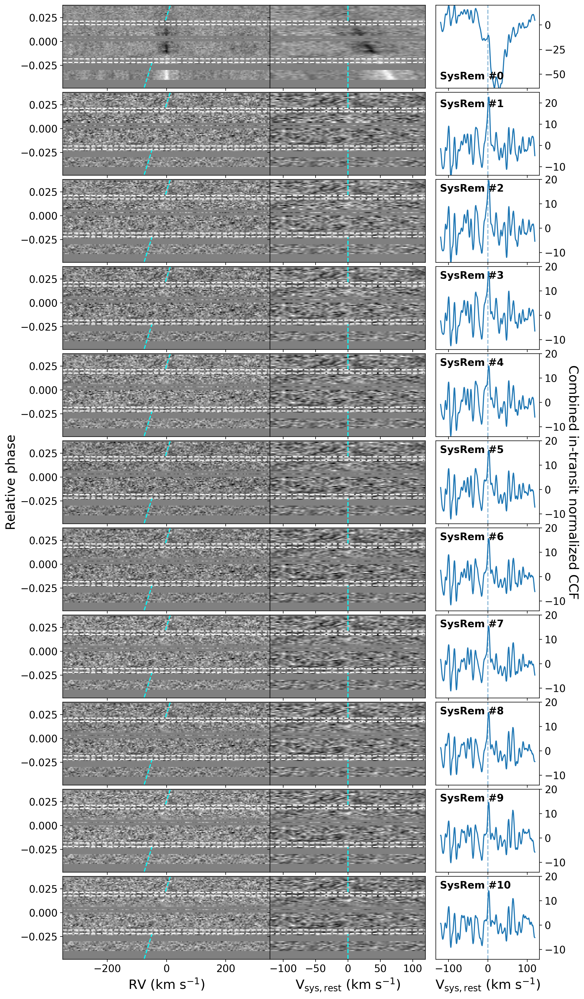

<Figure size 640x480 with 0 Axes>

In [10]:
class Light_Curve():

    def __init__(self,BJD,**kwargs):
        self.__dict__.update(**kwargs)
        self.bjd = BJD

    def calc_LC(self,elliptic=True,plot=True):

        R_jup = const.R_jup.value # meter
        R_sun = const.R_sun.value # meter
        
        # defining batman parameters
        params = batman.TransitParams()                                         # object to store transit parameters
        params.t0 = self.__dict__['T0']                                         # time of inferior conjunction (BJD)
        params.per = self.__dict__['P']                                         # orbital period (days)
        params.rp = (self.__dict__['R_p']*R_jup)/(self.__dict__['R_s']*R_sun)     # planet radius (units of stellar radii)
        params.a = self.__dict__['ap']                                          # semi-major axis (units of stellar radii)
        params.inc = self.__dict__['inc']                                       # orbital inclination (degrees)
        params.ecc = self.__dict__['e']                                         # eccentricity
        params.w = self.__dict__['w']                                           # longitude of periastron (degrees)
        params.limb_dark = self.__dict__['limb_dark_model']                     # limb darkening model
        params.u = self.__dict__['limb_dark_coeff']                             # limb darkening coefficients

        time = np.array(self.bjd)
        model = batman.TransitModel(params,time)
        flux_batman = model.light_curve(params)

        # calculating phase and relative phase from mid-transit
        phase = (time - self.__dict__['T0'])/self.__dict__['P'] % 1
        relative_phase = []
        for ph in range(phase.size):
            relative_phase.append(phase[ph] - 1) if phase[ph] > 0.5 else relative_phase.append(phase[ph])
        hour_phase = np.array(relative_phase) * self.__dict__['P'] * 24 # in hour (assuming 24 hours a day)

        # mask for out-transit frames (outside ingress and egress)
        mask_out_transit = 1 - flux_batman
        for fl in range(flux_batman.size):
            if mask_out_transit[fl] != 0: mask_out_transit[fl] = 1 

        # transit weight for cross-correlation calculation
        transit_weight = (1. - flux_batman)/np.max(1. - flux_batman)
        
        ########## Estimating the time for first to fourth contact (calculated following Exoplanets, 2010) ##########

        ap, inc, e, w = self.__dict__['ap'],self.__dict__['inc'],self.__dict__['e'],self.__dict__['w']
        Tp, P, R_p, R_s = self.__dict__['Tp'],self.__dict__['P'],self.__dict__['R_p']*R_jup,self.__dict__['R_s']*R_sun

        b = ap * np.cos(math.radians(inc)) * (1 - e**2)\
            / (1 + e*np.sin(math.radians(w))) # impact parameter
        
        if elliptic:
            total_duration = P / np.pi * np.arcsin(1/ap * (np.sqrt((1+R_p/R_s)**2 - b**2))/(np.sin(math.radians(inc)))) # from first to fourth contact
            full_duration = P / np.pi * np.arcsin(1/ap * (np.sqrt((1-R_p/R_s)**2 - b**2))/(np.sin(math.radians(inc)))) # from second to third contact
            ingress_to_egress = (total_duration - full_duration)/2
        else:
            ingress_to_egress = P / (ap*np.pi) / np.sqrt(1-b**2) * R_p / R_s

        intrans_frame = []
        for idx in range(len(flux_batman)-1):
            if np.abs(flux_batman[idx]-flux_batman[idx+1]) > 0.:
                intrans_frame.append(idx)
        intrans_frame[-1] += 1 # to anticipate last index

        contact_time = [time[intrans_frame[0]], time[intrans_frame[0]]+ingress_to_egress,time[intrans_frame[-1]]-ingress_to_egress,time[intrans_frame[-1]]]
        contact_index = np.argmin(np.abs(time - np.asarray(contact_time)[:,np.newaxis]),axis=1)

        return flux_batman,phase,relative_phase,hour_phase,mask_out_transit,transit_weight,contact_index
    
BJD_TDB_obs = np.array([58586.42631758, 58586.42948897, 58586.43266036, 58586.43705864,
       58586.44023002, 58586.44341298, 58586.44659594, 58586.45170026,
       58586.45488322, 58586.45807775, 58586.46256862, 58586.46575158,
       58586.46892297, 58586.47385367, 58586.47702505, 58586.48020801,
       58586.48425906, 58586.48744202, 58586.49062498, 58586.49540521,
       58586.4985766 , 58586.50174799, 58586.50640089, 58586.50957228,
       58586.51275524, 58586.5159382 , 58586.51912116, 58586.52229255,
       58586.52681814, 58586.52998953, 58586.53316091, 58586.53634387,
       58586.53951526, 58586.54269822, 58586.54755946, 58586.55073085,
       58586.55390223, 58586.55707362, 58586.56024501, 58586.56341639,
       58586.56789569, 58586.57107865, 58586.57425004, 58586.57743299,
       58586.58060437, 58586.58377576, 58586.58890322, 58586.59208618,
       58586.59528071, 58586.59846367, 58586.60164663, 58586.60482959,
       58586.60800098, 58586.61117236, 58586.6155822 , 58586.61876516,
       58586.62194812, 58586.6251195 , 58586.62830246, 58586.63148542,
       58586.63465681, 58586.63782818, 58586.64230748, 58586.64547887,
       58586.64866182, 58586.65184478, 58586.65501616, 58586.65819912,
       58586.66138207, 58586.66455346, 58586.66925267, 58586.67242404])

rvcor = np.array([8.60135875, 8.59931012, 8.59714869, 8.59396545, 8.59153719,
       8.5889888 , 8.58632967, 8.5818362 , 8.57889255, 8.57582991,
       8.57134284, 8.5680354 , 8.56463624, 8.55914831, 8.55548959,
       8.55171741, 8.54677337, 8.54277794, 8.53868641, 8.53236413,
       8.52805411, 8.52365357, 8.51704526, 8.51242778, 8.50770775,
       8.50290345, 8.49801653, 8.49306688, 8.48586792, 8.48073037,
       8.47551841, 8.4702144 , 8.46485876, 8.45941428, 8.45096939,
       8.44537848, 8.43972544, 8.43401221, 8.42824079, 8.42241323,
       8.41409061, 8.40811419, 8.40211032, 8.39603731, 8.38994148,
       8.38380295, 8.37379351, 8.36753075, 8.36121   , 8.35487935,
       8.34851819, 8.34212881, 8.33573685, 8.32932142, 8.32036593,
       8.31387998, 8.30737819, 8.30088661, 8.29436018, 8.2878249 ,
       8.28130692, 8.27478482, 8.26557038, 8.25904785, 8.25250532,
       8.24596896, 8.23946483, 8.23294776, 8.22644387, 8.21997903,
       8.21043292, 8.20401619])

# param for batman package
param = {} # case-sensitive

# convert BJD_UTC to BJD_TDB for T0
BJD_UTC = 54456.78760                           # transit midpoint, BJD_UTC-2400000 (Zhang+ 2018)
BJD_TDB = BJD_UTC + (32.184 + 34)/86400         # 34 is the number of leap seconds as of April 8th 2011 (Zhang data) since 1961
param['T0'] = BJD_TDB

# convert JD_UTC to BJD_TDB for Tp
# JDUTC = astropy.time.Time(63208.799999999814+2400000, format='jd', scale='utc') # epoch of periastron in JD (Ment+ 2018) observed in Keck
param['Tp'] = 63208.799999999814 # barycorrpy.utc_tdb.JDUTC_to_BJDTDB(JDUTC,starname='HD 149026', lat=19.82833333, longi=-155.47833333, alt=4160.)[0][0] - 2400000

param['P'] = 2.87588874                     # period, days (Zhang+ 2018)
param['R_p'] = 0.811                        # planet radius, Jupiter radii (Bonomo+ 2017)
param['R_s'] = 1.41                         # star radius, Sun radii (Stassun+ 2017)
semi_major = 0.04364                        # semi-major axis, AU (Bonomo+ 2017)
param['ap'] = semi_major*const.au.value\
    /(param['R_s']*const.R_sun.value)       # stellar radii
param['inc'] = 84.50                        # inclination, degrees (Bonomo+ 2017)
param['e'] = 0.0                              # eccentricity
param['w'] = -90                             # longitude of periastron, degrees
param['Vsys'] = -17.91

# calculated from https://exoctk.stsci.edu/limb_darkening using NIRSpec.F100LP.G140H.S200A1 bandpass
mu_nl = [0.619, -0.057,0.007,-0.024]        # non-linear limb darken
mu_qd = [0.075, 0.372]                      # quadratic limb darken
mu_lin = 0.39                               # linear limb darken
param['limb_dark_model'] = 'quadratic'
param['limb_dark_coeff'] = mu_qd

# # convert JD_UTC to BJD_TDB for observations
# JDUTC = astropy.time.Time(jd_temp+2400000, format='jd', scale='utc')
# BJD_TDB_obs = barycorrpy.utc_tdb.JDUTC_to_BJDTDB(JDUTC,starname='HD 149026', lat=19.82833333, longi=-155.47833333, alt=4160.)[0] - 2400000

lc = Light_Curve(BJD_TDB_obs,**param)
flux_batman,phase,relative_phase,hour_phase,mask_out_transit,transit_weight,contact_index = lc.calc_LC()

bad_frame = [71,44,43,41,40,19,18,17,16,15,6,5,4,3,2,1,0]

cc_total_temp = np.zeros((len(cc_total),len(phase),len(cc_total[0][0])))
cc_shifted_temp = np.zeros((len(cc_shifted),len(phase),len(cc_shifted[0][0])))
for sys in range(len(cc_total_temp)):
    idx = 0
    for i in range(len(cc_total_temp[sys])):
        if i not in bad_frame:
            cc_total_temp[sys][i] = cc_total[sys][idx]
            cc_shifted_temp[sys][i] = cc_shifted[sys][idx]
            idx += 1
        else:
            cc_total_temp[sys][i,:] = np.nan
            cc_shifted_temp[sys][i,:] = np.nan

fig = plt.figure(figsize=(10, 4),dpi=200)
colorm = 'gray'
cmap = plt.get_cmap(colorm)
cmap.set_bad(color = 'grey', alpha = 1.)
k=0
lbl = 18
RV_planet = Kp_planet * np.sin(2. * np.pi * phase) + (-rvcor) + Vsys_planet
for i in np.array([0,1,2,3,4,5,6,7,8,9,10]):

    axes_rvmap = [0, 0-k, 0.4, 0.4]
    axes_vsysmap = [0 + 0.4, 0-k, 0.3, 0.4]
    axes_cccombcurve = [0 + 0.4 + 0.3 + 0.02, 0-k, 0.2, 0.4]

    rvmap = plt.axes(axes_rvmap)
    vsysmap = plt.axes(axes_vsysmap)
    cccombcurve = plt.axes(axes_cccombcurve)

    frames = relative_phase#np.arange(len(rel_phase))

    #fig.supylabel('Relative phase',x=-0.08,y=-1.8)

    rvmap.pcolormesh(RV_sample, frames, cc_total_temp[i], cmap=cmap, rasterized=True)
    rvmap.plot((RV_planet[0], RV_planet[contact_index[0]]), (frames[0], frames[contact_index[0]]), ls='--', color='cyan', alpha=1, lw=1.5)
    rvmap.plot((RV_planet[-1], RV_planet[contact_index[3]]), (frames[-1], frames[contact_index[3]]), ls='--', color='cyan', alpha=1, lw=1.5)
    rvmap.axhline(y=frames[contact_index[0]], c="white", lw=1.5, alpha=1, ls="--")
    rvmap.axhline(y=frames[contact_index[1]], c="white", lw=1.5, alpha=1, ls="--")
    rvmap.axhline(y=frames[contact_index[2]], c="white", lw=1.5, alpha=1, ls="--")
    rvmap.axhline(y=frames[contact_index[3]], c="white", lw=1.5, alpha=1, ls="--")

    vsysmap.pcolormesh(Vsys_sample, frames, cc_shifted_temp[i], cmap=cmap, rasterized=True)
    vsysmap.plot((0, 0), (frames[0], frames[contact_index[0]]), ls='--', color='cyan', alpha=1, lw=1.5)
    vsysmap.plot((0, 0), (frames[-1], frames[contact_index[3]]), ls='--', color='cyan', alpha=1, lw=1.5)
    vsysmap.axhline(y=frames[contact_index[0]], c="white", lw=1.5, alpha=1, ls="--")
    vsysmap.axhline(y=frames[contact_index[1]], c="white", lw=1.5, alpha=1, ls="--")
    vsysmap.axhline(y=frames[contact_index[2]], c="white", lw=1.5, alpha=1, ls="--")
    vsysmap.axhline(y=frames[contact_index[3]], c="white", lw=1.5, alpha=1, ls="--")
    # vsysmap.axhline(y=frames[49])

    cccombcurve.plot(Vsys_sample, cc_combine[i])
    cccombcurve.axvline(x=0, ls="--", alpha=0.5)
    if i ==0:
        cccombcurve.set_ylim(-64,20)
        cccombcurve.text(-122,-55,'SysRem #'+str(i),weight='bold',fontsize=14)
    elif i==1:
        cccombcurve.text(-122,18,'SysRem #'+str(i),weight='bold',fontsize=14)
        cccombcurve.set_ylim(-14,25)
    else:
        cccombcurve.text(-122,15,'SysRem #'+str(i),weight='bold',fontsize=14)
        cccombcurve.set_ylim(-14,20)
    cccombcurve.yaxis.set_ticks_position('right')

    vsysmap.set_yticklabels([])

    if i==5:
        cccombcurve.set_ylabel('Combined in-transit normalized CCF', rotation=270, labelpad=18,fontsize=lbl)
        cccombcurve.yaxis.set_label_position("right")
        # cccombcurve.yaxis.set_label_coords(1.3,-0.1)
        rvmap.set_ylabel('Relative phase',fontsize=lbl)
    elif i == 10:
        rvmap.set_xlabel("RV (km s$^{-1}$)",fontsize=lbl)
        vsysmap.set_xlabel("V$_\mathrm{sys,rest}$ (km s$^{-1}$)",fontsize=lbl)
        cccombcurve.set_xlabel("V$_\mathrm{sys,rest}$ (km s$^{-1}$)",fontsize=lbl)
    else:
        rvmap.set_xticklabels([])
        vsysmap.set_xticklabels([])
        cccombcurve.set_xticklabels([])

    k+=0.4 + 0.02

    rvmap.tick_params(axis='both', which='major', labelsize=14)
    vsysmap.tick_params(axis='both', which='major', labelsize=14)
    cccombcurve.tick_params(axis='both', which='major', labelsize=14)

plt.savefig("figures/h2opokaz_cc.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()

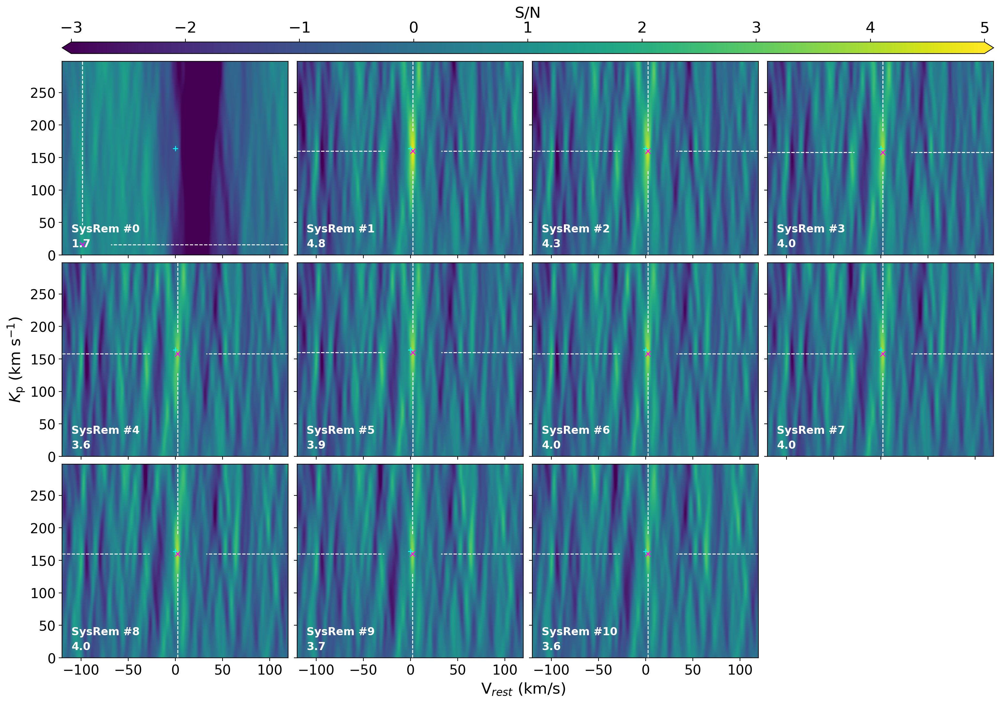

<Figure size 640x480 with 0 Axes>

In [11]:
# iter = np.array([[0,1],[2,3],[4,5],[6,7],[8,9],[10]])
iter = np.array([[0,1,2,3],[4,5,6,7],[8,9,10,11]])
snmap = snmap_h2o

fig = plt.figure(figsize=(7, 6),dpi=200)
colorm = 'viridis'
cmap = plt.get_cmap(colorm)
cmap.set_bad(color = 'white', alpha = 1.)
lbl = 17
# fig.supylabel("$K_\mathrm{p}$ (km s$^{-1}$)",x=-0.14,y=-0.52,fontsize=lbl)
fig.supxlabel("V$_{rest}$ (km/s)",y=-(0.52+0.52+0.1),x=1.02,fontsize=lbl)
k1 = 0
for i in range(len(iter)):
    k2 = 0
    for idx,j in enumerate(iter[i]):
        if i==len(iter)-1 and j==11:
            pass
        else:
            axes_kpvsysmap = [0+k2, 0-k1, 0.5, 0.5]
            kpvsysmap = plt.axes(axes_kpvsysmap)

            kmax,vmax = np.unravel_index(snmap[j].argmax(),snmap[j].shape)
            vsys_expect = (np.abs(Vsys_sample - 0)).argmin()
            kp_expect = (np.abs(Kp_sample - 164.27)).argmin()
            kpvsys = snmap[j]
            label = 'S/N'

            SN_mapcolorbar = kpvsysmap.pcolormesh(Vsys_sample, Kp_sample, kpvsys, cmap=cmap, vmax=5.0, vmin=-3,rasterized=True)
            gap = 30
            # vertical lines
            kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[0], Kp_sample[kmax] - gap), ls='--',
                        color='white', alpha=1, lw=1)
            kpvsysmap.plot((Vsys_sample[vmax], Vsys_sample[vmax]), (Kp_sample[-1], Kp_sample[kmax] + gap), ls='--',
                        color='white', alpha=1, lw=1)
            # horizontal lines
            kpvsysmap.plot((Vsys_sample[0], Vsys_sample[vmax] - gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                        color='white', alpha=1, lw=1)
            kpvsysmap.plot((Vsys_sample[-1], Vsys_sample[vmax] + gap), (Kp_sample[kmax], Kp_sample[kmax]), ls='--',
                        color='white', alpha=1, lw=1)
            kpvsysmap.plot(Vsys_sample[vmax],Kp_sample[kmax],'x',c='magenta')
            kpvsysmap.plot(Vsys_sample[vsys_expect],Kp_sample[kp_expect],'+',c='cyan')
            kpvsysmap.set_ylim([min(Kp_sample), max(Kp_sample)])
            kpvsysmap.set_xlim([min(Vsys_sample), max(Vsys_sample)])
            kpvsysmap.text(-110,35,'SysRem #'+str(j),color='white',weight='bold',fontsize=lbl-5)
            kpvsysmap.text(-110,12,str(round(np.max(kpvsys),1)),color='white',weight='bold',fontsize=lbl-5)

            if idx == 1 or idx == 2 or idx == 3:
                kpvsysmap.set_yticklabels([])
            k2+=0.52
            if i != len(iter)-1:
                kpvsysmap.set_xticklabels([])
            if i == 1 and idx == 0:
                # kpvsysmap.set_xlabel("$V_\mathrm{rest}$ (km s$^{-1}$)",y=-(0.52+0.52+0.52),fontsize=lbl)
                kpvsysmap.set_ylabel("$K_\mathrm{p}$ (km s$^{-1}$)",fontsize=lbl)

            kpvsysmap.tick_params(axis='both', which='major', labelsize=15)

    k1+=0.52

# p0 = h2o.get_position().get_points().flatten()
# p1 = combined.get_position().get_points().flatten()
ax_cbar = fig.add_axes([0, 0.52, 0.52+0.52+0.52+0.5, 0.03])
cbar = plt.colorbar(SN_mapcolorbar, cax=ax_cbar, orientation='horizontal',ticklocation='top',extend='both',extendfrac=0.01)
cbar.set_label('S/N',fontsize=lbl)
cbar.ax.tick_params(labelsize=lbl)

# cbar_ax = fig.add_axes([0.52*2, -2.6, 0.03, 3.1])
# cbar = fig.colorbar(SN_mapcolorbar, label=label, cax=cbar_ax, extend='both',extendfrac=0.01)
# cbar.set_label(label=label,size=lbl)
# cbar.ax.tick_params(labelsize=16)

plt.savefig("figures/h2opokaz_snmap.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()

## Injection Tests for Paper

### Injected at Negative $K_p$

In [11]:
# Formula taken from Exoplanets (Seager, 2010)
kp = (28.4329/np.sqrt(1-e**2))*(Ms*Msun/Mj)*np.sin(inc*np.pi/180)*(Mp*Mj/Msun+Ms)**(-2/3)*(P/365.2455)**(-1/3) #in m/s
kp /= 1000 #in km/s
print('Kp = '+str(kp)+' km/s')

# Calculate expected RV
vsys = -17.91                                                                                         
vrest = 2.5                                                     # km/s, based on above result from Kp-Vsys map of best-fit H2O model 
rvp = - kp * np.sin(2 * np.pi * phase) + vsys - rvcor + vrest   # using negative Kp
rvp_inject = rvp

def negative_kp(model_strength,sysrem_iteration,wave_inject,flux_inject,
                wave_cc,flux_cc,std_brogi=True):

    data.model_strength = model_strength
    data.RV_inject = rvp_inject
    data.wave_modelmol, data.flux_modelmol = wave_inject, flux_inject
    data.__dict__['plot_inject'] = False

    sysrem_iteration = sysrem_iteration
    fit_iteration = 20000
    a_final, c_final, sysrem_model, flux_final, error_final, wave_final = data.perform_sysrem(sysrem_iteration,fit_iteration,common_conti=True)

    sampling = 1.30
    RV_sample = np.arange(-350,350,sampling)    # in km/s
    Kp_sample = np.arange(-300,0,2.0)    # in km/s
    Kp_planet = -kp                          # in km/s (calculated from formula given in Exoplanets (Seager, 2010))
    Vsys_planet = vsys                       # in km/s (calculated from stellar RV analysis)
    Vsys_sample = np.arange(-120,120,0.5)  # in km/s
    A_sample = np.arange(-5.,5.,0.01)
    sys_num = sysrem_iteration

    e, w = 0.2529, 1.873681195169868
    JDUTC = astropy.time.Time(63208.799999999814+2400000, format='jd', scale='utc') # epoch of periastron in JD (Ment+ 2018) observed in Keck
    Tp = barycorrpy.utc_tdb.JDUTC_to_BJDTDB(JDUTC,starname='HD 149026', lat=19.82833333, longi=-155.47833333, alt=4160.)[0][0] - 2400000

    wvdat,fluxdat,errdat,adat = wave_final,flux_final,error_final,a_final
    snmap_negative = detect_molecules(wvdat,fluxdat,errdat,adat,wave_cc,flux_cc,sys_num+1,carm_order,
                    RV_sample,Kp_sample,Vsys_sample,A_sample,
                    Kp_planet,Vsys_planet,transit_weight,out_transit_mask,rvcor,phase,e,w,Tp,std_brogi=std_brogi,eccentric=False,plot=False,neg_Kp=True)
    
    return snmap_negative

Kp = 164.2748650093063 km/s


In [ ]:
strength = 1.4
sysiter = 10

snmap_h2o_pokaz_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

snmap_h2o_hitemp_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

snmap_h2o_POKAZinjHITEMPcc_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OHITEMP_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

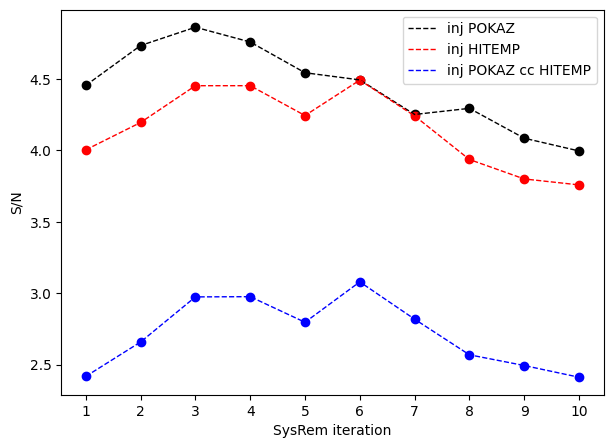

In [13]:
Kp_sample = np.arange(-300,0,2.)    # in km/s
Vsys_sample = np.arange(-120,120,0.5)  # in km/s
sn_sig,sn_sig_hitemp,sn_sig_duo = [],[],[]
kmax, vmax = (np.abs(Kp_sample + 164.27)).argmin(), (np.abs(Vsys_sample - 2.5)).argmin()
i_max = sysiter
for i in range(i_max):
    
    # kmax, vmax = np.unravel_index(snmap_h2o_pokaz_negative[0][1].argmax(),snmap_h2o_pokaz_negative[0][1].shape)
    sn_sig.append(snmap_h2o_pokaz_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_h2o_hitemp_negative[0][1].argmax(),snmap_h2o_hitemp_negative[0][1].shape)
    sn_sig_hitemp.append(snmap_h2o_hitemp_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_h2o_POKAZinjHITEMPcc_negative[0][1].argmax(),snmap_h2o_POKAZinjHITEMPcc_negative[0][1].shape)
    sn_sig_duo.append(snmap_h2o_POKAZinjHITEMPcc_negative[0][i][kmax,vmax])

plt.figure(figsize=(7,5),dpi=100)
plt.plot(np.arange(1,i_max+1),sn_sig,ls='--',lw=1,c='black',label='inj POKAZ')
plt.scatter(np.arange(1,i_max+1),sn_sig,c='black')
plt.plot(np.arange(1,i_max+1),sn_sig_hitemp,ls='--',lw=1,c='red',label='inj HITEMP')
plt.scatter(np.arange(1,i_max+1),sn_sig_hitemp,c='red')
plt.plot(np.arange(1,i_max+1),sn_sig_duo,ls='--',lw=1,c='blue',label='inj POKAZ cc HITEMP')
plt.scatter(np.arange(1,i_max+1),sn_sig_duo,c='blue')
plt.ylabel('S/N')
plt.xlabel('SysRem iteration')
plt.xticks(np.arange(1,11))
plt.legend()

In [14]:
print(sn_sig)
print(sn_sig_hitemp)
print(sn_sig_duo)

[4.45567660506943, 4.734830722797969, 4.8630285102459325, 4.759539057248795, 4.544316534637306, 4.494146321497344, 4.2521357465793, 4.2949142135032154, 4.085892593775477, 3.9966637449826714]
[4.004521274294374, 4.196029596232636, 4.453488066173718, 4.453633313404438, 4.244670386919741, 4.49250940892922, 4.242080509595683, 3.9368637644631543, 3.800598907187897, 3.758952338486305]
[2.418087026034921, 2.658898293766534, 2.9746810522291245, 2.9762293587553748, 2.7969723881624753, 3.0798441869862527, 2.8186354703347942, 2.5692103739205137, 2.4941985317523385, 2.412196711098791]


In [ ]:
strength = 1.0
sysiter = 10

snmap_hcn_solar_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

snmap_hcn_0d84_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO0d84_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO0d84_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO0d84_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO0d84_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

snmap_hcn_1d20_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d20_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d20_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d20_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d20_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

snmap_hcn_1d50_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d50_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d50_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d50_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO1d50_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

snmap_hcn_2d00_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO2d00_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO2d00_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO2d00_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO2d00_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

snmap_hcn_3d00_negative = negative_kp(strength,sysiter,pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO3d00_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO3d00_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO3d00_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_HCNExoMol_FeH0d36_CO3d00_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),std_brogi=False)

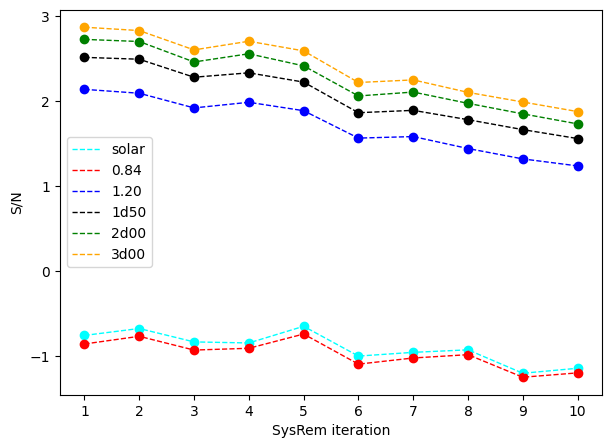

In [21]:
Kp_sample = np.arange(-300,0,2.)    # in km/s
Vsys_sample = np.arange(-120,120,0.5)  # in km/s
sn_sig,sn_sig_hitemp,sn_sig_duo,sn_sig_trio,sn_sig_dua,sn_sig_tiga = [],[],[],[],[],[]
kmax, vmax = (np.abs(Kp_sample + 164.27)).argmin(), (np.abs(Vsys_sample - 2.5)).argmin()
i_max = sysiter
for i in range(i_max):
    # kmax, vmax = np.unravel_index(snmap_hcn_solar_negative[0][1].argmax(),snmap_h2o_pokaz_negative[0][1].shape)
    sn_sig.append(snmap_hcn_solar_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_hcn_0d84_negative[0][1].argmax(),snmap_h2o_hitemp_negative[0][1].shape)
    sn_sig_hitemp.append(snmap_hcn_0d84_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_hcn_1d20_negative[0][1].argmax(),snmap_h2o_POKAZinjHITEMPcc_negative[0][1].shape)
    sn_sig_duo.append(snmap_hcn_1d20_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_hcn_1d50_negative[0][1].argmax(),snmap_h2o_POKAZinjHITEMPcc_negative[0][1].shape)
    sn_sig_trio.append(snmap_hcn_1d50_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_hcn_2d00_negative[0][1].argmax(),snmap_h2o_POKAZinjHITEMPcc_negative[0][1].shape)
    sn_sig_dua.append(snmap_hcn_2d00_negative[0][i][kmax,vmax])

    # kmax, vmax = np.unravel_index(snmap_hcn_3d00_negative[0][1].argmax(),snmap_h2o_POKAZinjHITEMPcc_negative[0][1].shape)
    sn_sig_tiga.append(snmap_hcn_3d00_negative[0][i][kmax,vmax])

plt.figure(figsize=(7,5),dpi=100)
plt.plot(np.arange(1,i_max+1),sn_sig,ls='--',lw=1,c='cyan',label='solar')
plt.scatter(np.arange(1,i_max+1),sn_sig,c='cyan')
plt.plot(np.arange(1,i_max+1),sn_sig_hitemp,ls='--',lw=1,c='red',label='0.84')
plt.scatter(np.arange(1,i_max+1),sn_sig_hitemp,c='red')
plt.plot(np.arange(1,i_max+1),sn_sig_duo,ls='--',lw=1,c='blue',label='1.20')
plt.scatter(np.arange(1,i_max+1),sn_sig_duo,c='blue')
plt.plot(np.arange(1,i_max+1),sn_sig_trio,ls='--',lw=1,c='black',label='1d50')
plt.scatter(np.arange(1,i_max+1),sn_sig_trio,c='black')
plt.plot(np.arange(1,i_max+1),sn_sig_dua,ls='--',lw=1,c='green',label='2d00')
plt.scatter(np.arange(1,i_max+1),sn_sig_dua,c='green')
plt.plot(np.arange(1,i_max+1),sn_sig_tiga,ls='--',lw=1,c='orange',label='3d00')
plt.scatter(np.arange(1,i_max+1),sn_sig_tiga,c='orange')
plt.ylabel('S/N')
plt.xlabel('SysRem iteration')
plt.xticks(np.arange(1,11))
plt.legend()

In [22]:
print(sn_sig)
print(sn_sig_hitemp)
print(sn_sig_duo)
print(sn_sig_trio)
print(sn_sig_dua)
print(sn_sig_tiga)

[-0.7535031089372193, -0.6721970887434469, -0.8297659287684913, -0.8420272542364462, -0.6461820702750307, -0.9962454880104135, -0.9523884253395398, -0.9228799014900952, -1.198095046988013, -1.1393123291842735]
[-0.8541395068261745, -0.7638619824910629, -0.9256301642141205, -0.9045681205966738, -0.7371263265631911, -1.0908902127188318, -1.0185919308856806, -0.9797809698964122, -1.2447049804946115, -1.193674521675277]
[2.1379012809889146, 2.0922059857936897, 1.9198914172598855, 1.9858767423380568, 1.887128392284496, 1.5650643243914881, 1.5831219780919694, 1.4425009562585283, 1.3204921667118246, 1.2382023282342418]
[2.513773298655478, 2.4919382176087246, 2.2804011850213484, 2.3320927103569264, 2.2232057225868926, 1.8634590873044374, 1.8912587929692912, 1.7814708696648573, 1.66478300792704, 1.5598488927511842]
[2.7250472134815102, 2.7001905537463395, 2.4596241879676084, 2.556106874559854, 2.4138869356476107, 2.0603376610294193, 2.106147985702921, 1.9734506796570581, 1.8500961096255624, 1.7

### Injected at Retrieved Velocities

In [23]:
# Calculate expected RV
vsys = -17.91
kp = 160.0                                                     # km/s, based on above result from Kp-Vsys map of best-fit H2O model                                                                                        
vrest = 2.5                                                   # km/s, based on above result from Kp-Vsys map of best-fit H2O model 
rvp = kp * np.sin(2 * np.pi * phase) + vsys - rvcor + vrest
rvp_inject = rvp

def retrieved_vel(wave_inject,flux_inject,
                wave_cc,flux_cc,std_brogi=True):

    data.model_strength = 0.96
    data.RV_inject = rvp_inject
    data.wave_modelmol, data.flux_modelmol = wave_inject, flux_inject
    data.__dict__['plot_inject'] = False

    sysrem_iteration = 2
    fit_iteration = 20000
    a_final, c_final, sysrem_model, flux_final, error_final, wave_final = data.perform_sysrem(sysrem_iteration,fit_iteration,common_conti=True)

    sampling = 1.30
    RV_sample = np.arange(-350,350,sampling)    # in km/s
    Kp_sample = np.arange(0,300,2.)       # in km/s
    Kp_planet = kp                              # in km/s (calculated from formula given in Exoplanets (Seager, 2010))
    Vsys_planet = vsys                          # in km/s (calculated from stellar RV analysis)
    Vsys_sample = np.arange(-120,120,0.5)  # in km/s
    A_sample = np.arange(-5.,5.,0.01)
    sys_num = sysrem_iteration

    wvdat,fluxdat,errdat = wave_final,flux_final,error_final

    e, w = 0.2529, 1.873681195169868
    JDUTC = astropy.time.Time(63208.799999999814+2400000, format='jd', scale='utc') # epoch of periastron in JD (Ment+ 2018) observed in Keck
    Tp = barycorrpy.utc_tdb.JDUTC_to_BJDTDB(JDUTC,starname='HD 149026', lat=19.82833333, longi=-155.47833333, alt=4160.)[0][0] - 2400000

    wvdat,fluxdat,errdat,adat = wave_final,flux_final,error_final,a_final
    snmap_ret = detect_molecules(wvdat,fluxdat,errdat,adat,wave_cc,flux_cc,sys_num+1,carm_order,
                    RV_sample,Kp_sample,Vsys_sample,A_sample,
                    Kp_planet,Vsys_planet,transit_weight,out_transit_mask,rvcor,phase,e,w,Tp,std_brogi=std_brogi,eccentric=False,plot=True,neg_Kp=False)
    
    return snmap_ret

In [ ]:
snmap_h2o_negflux = retrieved_vel(pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       -1 * pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

In [ ]:
snmap_h2o_posflux = retrieved_vel(pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

In [ ]:
snmap_h2o_posflux_diff_vrest = retrieved_vel(pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_wave_woRotBroad.pkl'),
                                       pd.read_pickle(r'models/HD149026b_H2OPOKAZ_FeH0d36_COsolar_isoTeff1700_cloudFalseP010_abundCE_flux_woRotBroad.pkl'))

### Plot Injected Models

In [28]:
lbl = 18

# fig, (h2o, hcn) = plt.subplots(1, 2, figsize=(15, 10), dpi=200, gridspec_kw={'wspace': 0.1, 'left': 0.1, 'right': 0.9, 'top': 0.9, 'bottom': 0.1})
fig = plt.figure(figsize=(15, 14),dpi=600)

axes_neg = [0+0.2, 0+0.38, 0.4, 0.3]
axes_h2o = [0, 0, 0.4, 0.3]
axes_hcn = [0+0.41, 0, 0.4, 0.3]

neg = plt.axes(axes_neg)
h2o = plt.axes(axes_h2o)
hcn = plt.axes(axes_hcn)

# Kp_sample = np.arange(0,300,sampling)       # in km/s
# h2o.plot(Vsys_sample,snmap_h2o[0][(np.abs(Kp_sample - 163.8)).argmin(),:],label=r'Observed POKAZATEL signal',c='black')

sampling = 2.0
Kp_sample = np.arange(-300,0,sampling)       # in km/s
h2o.plot(Vsys_sample,snmap_h2o_pokaz_negative[0][2][(np.abs(Kp_sample - -164.27)).argmin(),:],label=r'Injected POKAZATEL signal',ls='--',c='orange') 
h2o.plot(Vsys_sample,snmap_h2o_hitemp_negative[0][5][(np.abs(Kp_sample - -164.27)).argmin(),:],label=r'Injected HITEMP signal',ls='--',c='blue') 
h2o.plot(Vsys_sample,snmap_h2o_POKAZinjHITEMPcc_negative[0][5][(np.abs(Kp_sample - -164.27)).argmin(),:],label=r'Inj-POKAZ and CC-HITEMP',c='green',ls='--')
# h2o.axhline(y=4.5) 
h2o.set_ylim(-3.5,6.)
h2o.set_yticks([-2,0,2,4])
h2o.legend(loc='lower left',prop={'size': 12})
h2o.fill_between(Vsys_sample, -3,3, color='gray',alpha=0.1)
h2o.tick_params(axis='both', which='major', labelsize=lbl)
h2o.set_ylabel('S/N',fontsize=lbl)
h2o.set_xlabel(r'$V_\mathrm{rest}$ (km s$^{-1}$)',fontsize=lbl)
h2o.axvline(x=2.,ls='--',lw=1,c='black')
h2o.set_xlim(-50,50)
h2o.set_title('H$_2$O with different line lists',fontsize=lbl)

sysiter = 1
hcn.plot(Vsys_sample,snmap_hcn_solar_negative[0][4][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = solar',ls='--',c='black')
hcn.plot(Vsys_sample,snmap_hcn_0d84_negative[0][4][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = 0.84',ls='--',c='red')
hcn.plot(Vsys_sample,snmap_hcn_1d20_negative[0][sysiter][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = 1.20',ls='--',c='blue')
hcn.plot(Vsys_sample,snmap_hcn_1d50_negative[0][sysiter][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = 1.50',ls='--',c='orange')
hcn.plot(Vsys_sample,snmap_hcn_2d00_negative[0][sysiter][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = 2.00',ls='--',c='green')
hcn.plot(Vsys_sample,snmap_hcn_3d00_negative[0][sysiter][(np.abs(Kp_sample - -164.27)).argmin(),:],label='C/O = 3.00',ls='--',c='purple')
hcn.set_ylim(-3.5,6.)
hcn.set_yticks([-2,0,2,4])
hcn.set_xticks([-75,-50,-25,0,25,50,75,100])
hcn.set_yticklabels([])
# hcn.set_ylabel('S/N',fontsize=lbl)
hcn.legend(loc='lower left',prop={'size': 12})
hcn.fill_between(Vsys_sample, -3,3, color='gray',alpha=0.1)
hcn.tick_params(axis='both', which='major', labelsize=lbl)
hcn.set_xlabel(r'$V_\mathrm{rest}$ (km s$^{-1}$)',fontsize=lbl)
hcn.axvline(x=2.,ls='--',lw=1,c='black')
hcn.set_xlim(-50,50)
hcn.set_title('HCN with Exomol',fontsize=lbl)

Kp_sample = np.arange(0,300,sampling)       # in km/s
neg.plot(Vsys_sample,snmap_h2o[0][(np.abs(Kp_sample - 162.0)).argmin(),:],label=r'Observed signal',c='black')
neg.plot(Vsys_sample,snmap_h2o_negflux[0][0][(np.abs(Kp_sample - 164.27)).argmin(),:],label=r'Injected negative model',c='red',ls='--')
neg.fill_between(Vsys_sample, -3,3, color='gray',alpha=0.1)
neg.set_xlabel(r'$V_\mathrm{rest}$ (km s$^{-1}$)',fontsize=lbl)
neg.set_ylabel('S/N',fontsize=lbl)
neg.set_xlim(-50,50)
neg.set_ylim(-3.5,5.)
neg.legend(prop={'size': 12})
neg.tick_params(axis='both', which='major', labelsize=lbl)
neg.axvline(x=2.,ls='--',lw=1,c='black')
neg.set_title('H$_2$O with POKAZATEL',fontsize=lbl)

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
plt.savefig("figures/injection_test.pdf",format="pdf",dpi=200,bbox_inches="tight",pad_inches=0.1)
plt.show(block=False)
plt.clf()

<Figure size 640x480 with 0 Axes>